In [ ]:
import os
from google.colab import drive
if not os.path.ismount("/content/drive"):
    drive.mount("/content/drive", force_remount=False)
%cd "/content/drive/MyDrive/Capstone/rohlik-orders-forecasting-challenge"

Mounted at /content/drive
/content/drive/MyDrive/Capstone/rohlik-orders-forecasting-challenge


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from category_encoders.target_encoder import TargetEncoder
from sklearn.linear_model import LassoCV, LinearRegression
from sklearn.model_selection import TimeSeriesSplit
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.inspection import permutation_importance

#### train_data: 7k



In [ ]:
train_data = pd.read_csv("train.csv")
print(train_data.shape)
train_data.head(2)

(7340, 18)


,warehouse,date,orders,holiday_name,holiday,shutdown,mini_shutdown,shops_closed,winter_school_holidays,school_holidays,blackout,mov_change,frankfurt_shutdown,precipitation,snow,user_activity_1,user_activity_2,id
0,Prague_1,2020-12-05,6895.0,NaN,0,0,0,0,0,0,0,0.0,0,0.0,0.0,1722.0,32575.0,Prague_1_2020-12-05
1,Prague_1,2020-12-06,6584.0,NaN,0,0,0,0,0,0,0,0.0,0,0.0,0.0,1688.0,32507.0,Prague_1_2020-12-06


In [ ]:
print(f" train_data {train_data['date'].min()} to {train_data['date'].max()} ")

# 1 month December of train_data
# 2021 - 2022
# 2022 - 2023
# 3 months January - March of train_data

 train_data 2020-12-05 to 2024-03-15 


In [ ]:
(train_data['date'].value_counts() != 7).sum()

np.int64(575)

In [ ]:
train_data['warehouse'].unique()

array(['Prague_1', 'Brno_1', 'Prague_2', 'Prague_3', 'Munich_1',
       'Frankfurt_1', 'Budapest_1'], dtype=object)

In [ ]:
for w in ['Prague_1', 'Prague_2', 'Prague_3', 'Budapest_1', 'Brno_1','Munich_1', 'Frankfurt_1']:
  w_data = train_data[train_data['warehouse'] == w]
  print(f" {w} {w_data['date'].min()} to {w_data['date'].max()} with {len(w_data['date'])} dates")

 Prague_1 2020-12-05 to 2024-03-15 with 1193 dates
 Prague_2 2020-12-05 to 2024-03-15 with 1193 dates
 Prague_3 2020-12-05 to 2024-03-15 with 1193 dates
 Budapest_1 2020-12-05 to 2024-03-14 with 1154 dates
 Brno_1 2020-12-05 to 2024-03-15 with 1193 dates
 Munich_1 2021-07-21 to 2024-03-15 with 785 dates
 Frankfurt_1 2022-02-18 to 2024-03-15 with 629 dates


 #### train_calendar: 13k

In [ ]:
train_calendar = pd.read_csv("train_calendar.csv")
print(train_calendar.shape)
train_calendar.head(2)

(13307, 15)


,date,holiday_name,holiday,shutdown,mini_shutdown,warehouse_limited,shops_closed,winter_school_holidays,school_holidays,blackout,mov_change,frankfurt_shutdown,precipitation,snow,warehouse
0,2022-03-09,NaN,0,0,0,0,0,1,0,0,0.0,0,0.0,0.0,Prague_1
1,2019-07-03,NaN,0,0,0,0,0,0,0,0,0.0,0,0.0,0.0,Prague_1


In [ ]:
print(f" train_calendar {train_calendar['date'].min()} to {train_calendar['date'].max()} ")

# Has extra 1 year of data from Jan 2019 - Dec 2020
# Also has additional intermediate data

 train_calendar 2019-01-01 to 2024-03-15 


In [ ]:
common_cols = list(train_calendar.columns.intersection(train_data.columns))
df = pd.merge(train_calendar, train_data, on=common_cols, how="left")
df['orders'] = df['orders'].fillna(0)
df = df[(df['date'] >= train_data['date'].min()) & (df['date'] <= train_data['date'].max())]
for w in ['Prague_1', 'Prague_2', 'Prague_3', 'Budapest_1', 'Brno_1','Munich_1', 'Frankfurt_1']:
  w_data = df[df['warehouse'] == w]
  print(f" {w} {w_data['date'].min()} to {w_data['date'].max()} with {len(w_data['date'])} dates")

 Prague_1 2020-12-05 to 2024-03-15 with 1197 dates
 Prague_2 2020-12-05 to 2024-03-15 with 1197 dates
 Prague_3 2020-12-05 to 2024-03-15 with 1197 dates
 Budapest_1 2020-12-05 to 2024-03-15 with 1197 dates
 Brno_1 2020-12-05 to 2024-03-15 with 1197 dates
 Munich_1 2020-12-05 to 2024-03-15 with 1197 dates
 Frankfurt_1 2020-12-05 to 2024-03-15 with 1197 dates


In [ ]:
train_data['date'] = pd.to_datetime(train_data['date'])
train_data = train_data.sort_values(by='date')
display(train_data.head(1))
display(train_data.tail(1))

,warehouse,date,orders,holiday_name,holiday,shutdown,mini_shutdown,shops_closed,winter_school_holidays,school_holidays,blackout,mov_change,frankfurt_shutdown,precipitation,snow,user_activity_1,user_activity_2,id
0,Prague_1,2020-12-05,6895.0,NaN,0,0,0,0,0,0,0,0.0,0,0.0,0.0,1722.0,32575.0,Prague_1_2020-12-05


,warehouse,date,orders,holiday_name,holiday,shutdown,mini_shutdown,shops_closed,winter_school_holidays,school_holidays,blackout,mov_change,frankfurt_shutdown,precipitation,snow,user_activity_1,user_activity_2,id
6185,Frankfurt_1,2024-03-15,1916.0,NaN,0,0,0,0,0,0,0,0.0,0,0.0,0.0,821.0,7252.0,Frankfurt_1_2024-03-15


In [ ]:
train_calendar['date'].value_counts().unique()

array([7])

In [ ]:
train_calendar[train_calendar['date'] == '2020-12-05']

,date,holiday_name,holiday,shutdown,mini_shutdown,warehouse_limited,shops_closed,winter_school_holidays,school_holidays,blackout,mov_change,frankfurt_shutdown,precipitation,snow,warehouse
1581,2020-12-05,NaN,0,0,0,0,0,0,0,0,0.0,0,0.0,0.0,Prague_1
2171,2020-12-05,NaN,0,0,0,0,0,0,0,0,0.0,0,0.0,0.0,Brno_1
5531,2020-12-05,NaN,0,0,0,0,0,0,0,0,0.0,0,0.0,0.0,Prague_2
6455,2020-12-05,NaN,0,0,0,0,0,0,0,0,0.0,0,NaN,NaN,Prague_3
7937,2020-12-05,NaN,0,0,0,0,0,0,0,0,0.0,0,0.0,0.0,Munich_1
10532,2020-12-05,NaN,0,0,0,0,0,0,0,0,0.0,0,NaN,NaN,Frankfurt_1
13205,2020-12-05,NaN,0,0,0,0,0,0,0,0,0.0,0,0.3,0.0,Budapest_1


### Understanding time series with train_data

In [ ]:
## Split train_data
from sklearn.model_selection import train_test_split
from datetime import datetime, timedelta

df['date'] = pd.to_datetime(df['date'])
df = df.sort_values(by='date')
train_test_divider_date = df['date'].max() - timedelta(days=60)
train = df.loc[ df['date'] < train_test_divider_date].copy()
test = df.loc[ df['date'] >= train_test_divider_date].copy()

We want to see if we can see any patterns either daily, weekly, monthly, or yearly. This can help advise our forecasting models of important patterns

In [ ]:
# 1 month December of train_data
# 2021 - 2022
# 2022 - 2023
# 3 months January - March of train_data
train[['warehouse', 'date', 'orders']]

,warehouse,date,orders
2171,Brno_1,2020-12-05,6447.0
10532,Frankfurt_1,2020-12-05,0.0
5531,Prague_2,2020-12-05,4154.0
1581,Prague_1,2020-12-05,6895.0
6455,Prague_3,2020-12-05,4091.0
...,...,...,...
8012,Munich_1,2024-01-14,0.0
3947,Prague_2,2024-01-14,6371.0
2424,Brno_1,2024-01-14,8597.0
6497,Prague_3,2024-01-14,5648.0


In [ ]:
train.head()

,date,holiday_name,holiday,shutdown,mini_shutdown,warehouse_limited,shops_closed,winter_school_holidays,school_holidays,blackout,mov_change,frankfurt_shutdown,precipitation,snow,warehouse,orders,user_activity_1,user_activity_2,id
2171,2020-12-05,NaN,0,0,0,0,0,0,0,0,0.0,0,0.0,0.0,Brno_1,6447.0,2332.0,27392.0,Brno_1_2020-12-05
10532,2020-12-05,NaN,0,0,0,0,0,0,0,0,0.0,0,NaN,NaN,Frankfurt_1,0.0,NaN,NaN,NaN
5531,2020-12-05,NaN,0,0,0,0,0,0,0,0,0.0,0,0.0,0.0,Prague_2,4154.0,1317.0,18462.0,Prague_2_2020-12-05
1581,2020-12-05,NaN,0,0,0,0,0,0,0,0,0.0,0,0.0,0.0,Prague_1,6895.0,1722.0,32575.0,Prague_1_2020-12-05
6455,2020-12-05,NaN,0,0,0,0,0,0,0,0,0.0,0,NaN,NaN,Prague_3,4091.0,964.0,17693.0,Prague_3_2020-12-05


We add multiple important features from the date column to help capture seasonality or trends across time.

In [ ]:
train['date'] = pd.to_datetime(train['date'])
train["weekday_name"] = train['date'].dt.day_name()
train["day"] = train['date'].dt.day
train["hour"] = train['date'].dt.hour
train["month"] = train['date'].dt.month
train["month_name"] = train['date'].dt.month_name()
train["year"] = train['date'].dt.year
train["quarter"] = "Q" + train['date'].dt.quarter.astype(str)
train["year_quarter"] = train['year'].astype(str) + " " + train["quarter"]

train["month_day"] = train['month'].astype(str) + "/" + train['day'].astype(str)

In [ ]:
train.head()

,date,holiday_name,holiday,shutdown,mini_shutdown,warehouse_limited,shops_closed,winter_school_holidays,school_holidays,blackout,...,id,weekday_name,day,hour,month,month_name,year,quarter,year_quarter,month_day
2171,2020-12-05,NaN,0,0,0,0,0,0,0,0,...,Brno_1_2020-12-05,Saturday,5,0,12,December,2020,Q4,2020 Q4,12/5
10532,2020-12-05,NaN,0,0,0,0,0,0,0,0,...,NaN,Saturday,5,0,12,December,2020,Q4,2020 Q4,12/5
5531,2020-12-05,NaN,0,0,0,0,0,0,0,0,...,Prague_2_2020-12-05,Saturday,5,0,12,December,2020,Q4,2020 Q4,12/5
1581,2020-12-05,NaN,0,0,0,0,0,0,0,0,...,Prague_1_2020-12-05,Saturday,5,0,12,December,2020,Q4,2020 Q4,12/5
6455,2020-12-05,NaN,0,0,0,0,0,0,0,0,...,Prague_3_2020-12-05,Saturday,5,0,12,December,2020,Q4,2020 Q4,12/5


#### All warehouses

Text(0, 0.5, 'Orders')

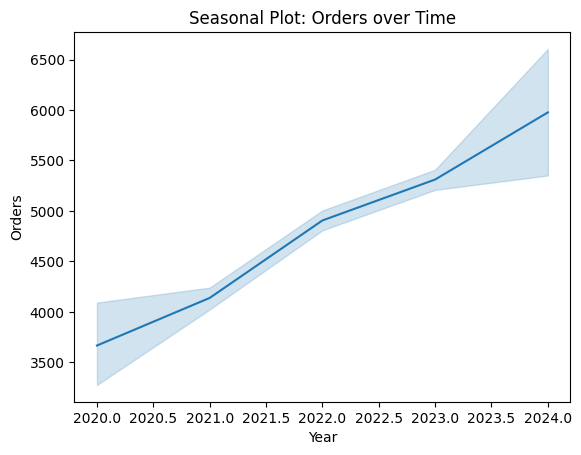

In [ ]:
ax = sns.lineplot(data=train, x='year',y='orders')
ax.set_title("Seasonal Plot: Orders over Time")
ax.set_xlabel("Year")
ax.set_ylabel("Orders")

We have a general trend of orders increasing over time.

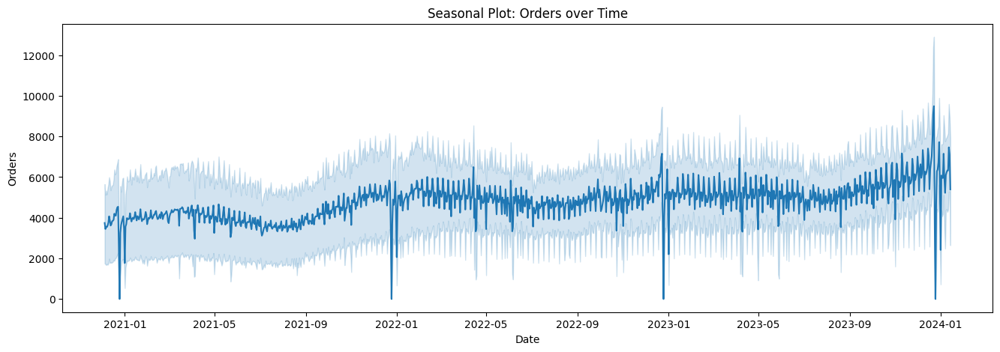

In [ ]:
fig, ax = plt.subplots(figsize=(16, 5))
ax = sns.lineplot(data=train, x='date',y='orders',ax=ax)
ax.set_title("Seasonal Plot: Orders over Time")
ax.set_xlabel("Date")
ax.set_ylabel("Orders")
fig.show()

Appears to be a big drop at the end of each year, and some repetitive patterns within a year

Text(0, 0.5, 'Orders')

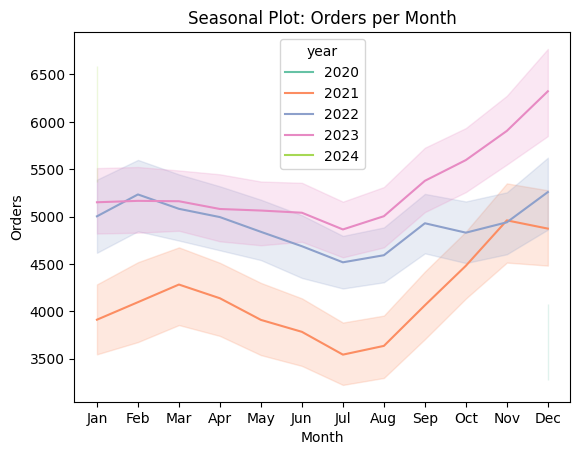

In [ ]:
# Orders per year
ax = sns.lineplot(data=train, x='month',y='orders', hue='year', palette="Set2")
ax.set_xticks(ticks=range(1, 13),
  labels=["Jan", "Feb", "Mar", "Apr", "May", "Jun",
          "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"],
)
ax.set_title("Seasonal Plot: Orders per Month")
ax.set_xlabel("Month")
ax.set_ylabel("Orders")

In [ ]:
train['year'].unique()

array([2020, 2021, 2022, 2023, 2024], dtype=int32)

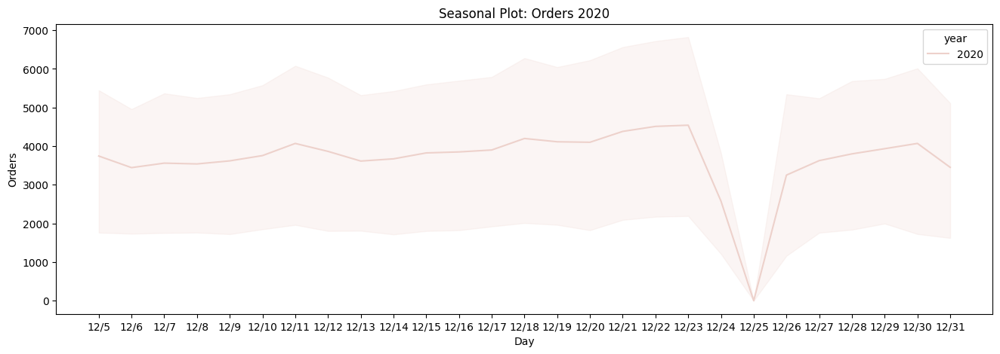

In [ ]:
fig, ax = plt.subplots(figsize=(16, 5))
train_subset = train[train['year'] == 2020]
ax = sns.lineplot(data=train_subset, x='month_day',y='orders', ax=ax, hue='year')
ax.set_title("Seasonal Plot: Orders 2020")
ax.set_xlabel("Day")
ax.set_ylabel("Orders")
fig.show()

In [ ]:
train.columns

Index(['date', 'holiday_name', 'holiday', 'shutdown', 'mini_shutdown',
       'warehouse_limited', 'shops_closed', 'winter_school_holidays',
       'school_holidays', 'blackout', 'mov_change', 'frankfurt_shutdown',
       'precipitation', 'snow', 'warehouse', 'orders', 'user_activity_1',
       'user_activity_2', 'id', 'weekday_name', 'day', 'hour', 'month',
       'month_name', 'year', 'quarter', 'year_quarter', 'month_day'],
      dtype='object')

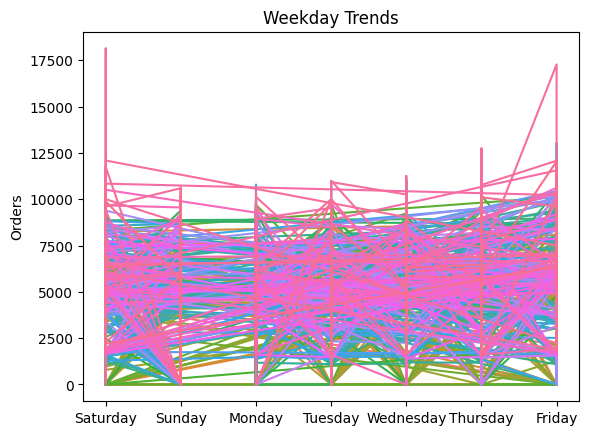

In [ ]:
weeks = train["date"].dt.to_period("W-SUN").dt.start_time
unique_weeks = weeks.unique()
palette = sns.color_palette("husl", n_colors=len(unique_weeks))
color_map = dict(zip(unique_weeks, palette))

groups = train["date"].dt.to_period("W-SUN").dt.start_time
fig, ax = plt.subplots()
for df_week in train.groupby(groups):
    week, df_w = df_week
    df_w = df_w.sort_values("date")

    ax.plot(
        df_w["weekday_name"],
        df_w["orders"],
        color=color_map[week],
        label=str(week.date())
    )
ax.set_title("Weekday Trends")
ax.set_ylabel("Orders")
fig.show()

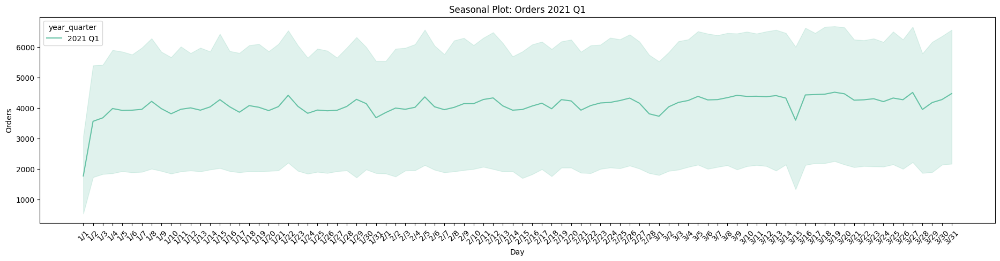

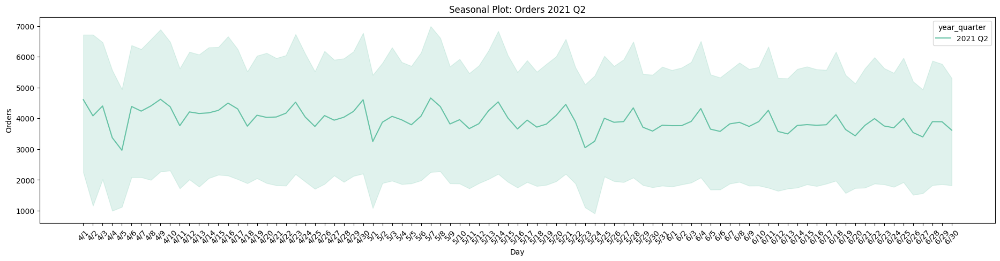

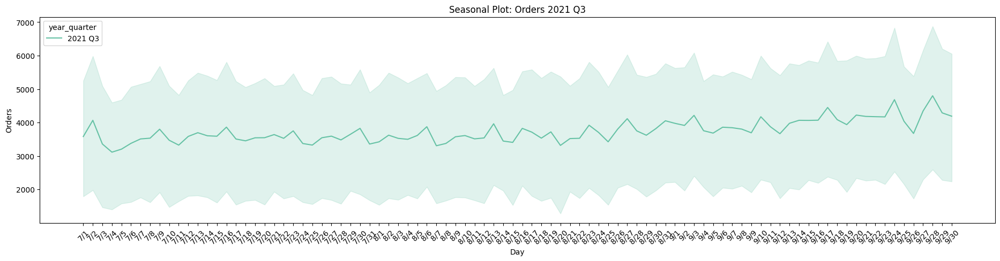

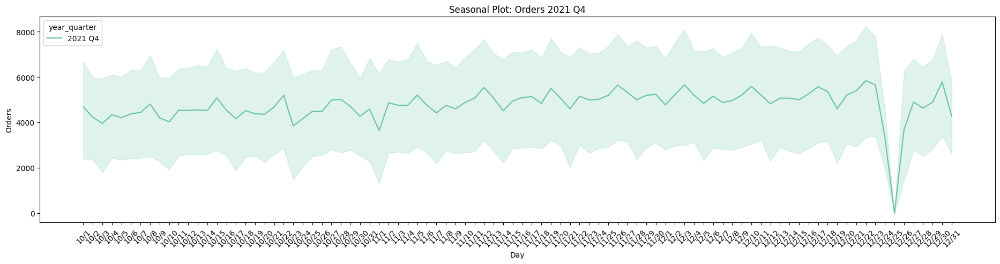

In [ ]:
fig, ax = plt.subplots(figsize=(23, 5))
train_subset = train[train['year_quarter'] == '2021 Q1']
ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
ax.set_title("Seasonal Plot: Orders 2021 Q1")
ax.set_xlabel("Day")
ax.set_ylabel("Orders")
ax.tick_params(axis='x', labelrotation=45)
fig.show()

fig, ax = plt.subplots(figsize=(23, 5))
train_subset = train[train['year_quarter'] == '2021 Q2']
ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
ax.set_title("Seasonal Plot: Orders 2021 Q2")
ax.set_xlabel("Day")
ax.set_ylabel("Orders")
ax.tick_params(axis='x', labelrotation=45)
fig.show()

fig, ax = plt.subplots(figsize=(23, 5))
train_subset = train[train['year_quarter'] == '2021 Q3']
ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
ax.set_title("Seasonal Plot: Orders 2021 Q3")
ax.set_xlabel("Day")
ax.set_ylabel("Orders")
ax.tick_params(axis='x', labelrotation=45)
fig.show()

fig, ax = plt.subplots(figsize=(23, 5))
train_subset = train[train['year_quarter'] == '2021 Q4']
ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
ax.set_title("Seasonal Plot: Orders 2021 Q4")
ax.set_xlabel("Day")
ax.set_ylabel("Orders")
ax.tick_params(axis='x', labelrotation=45)
fig.show()

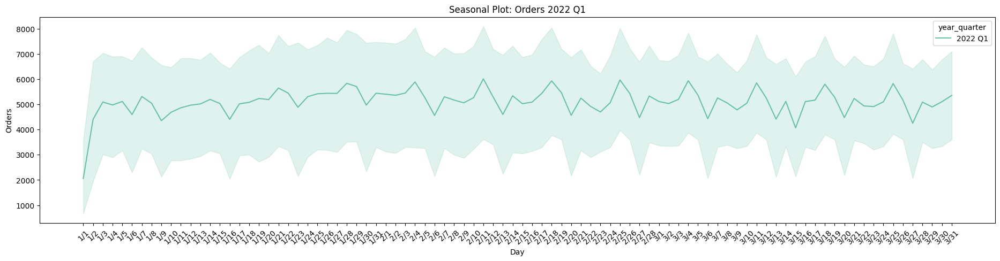

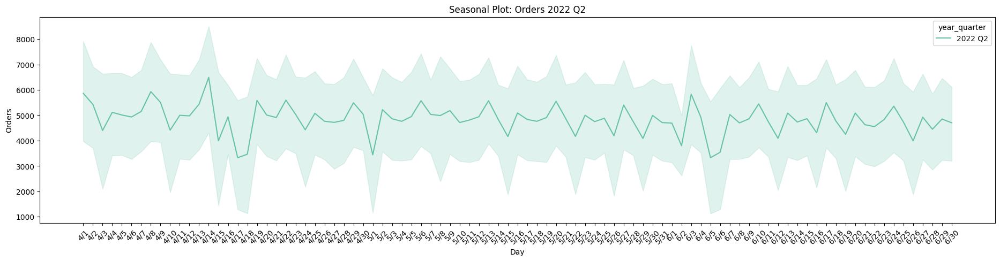

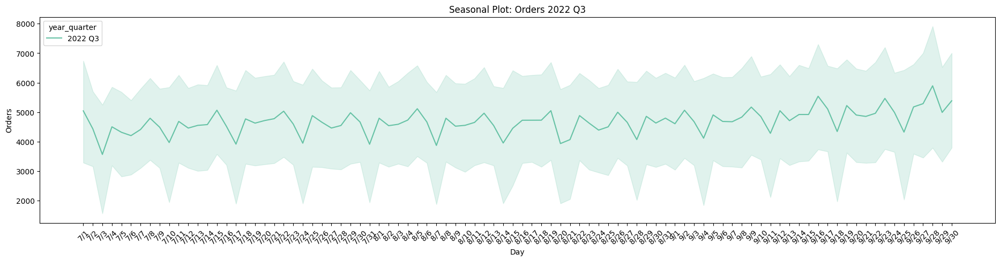

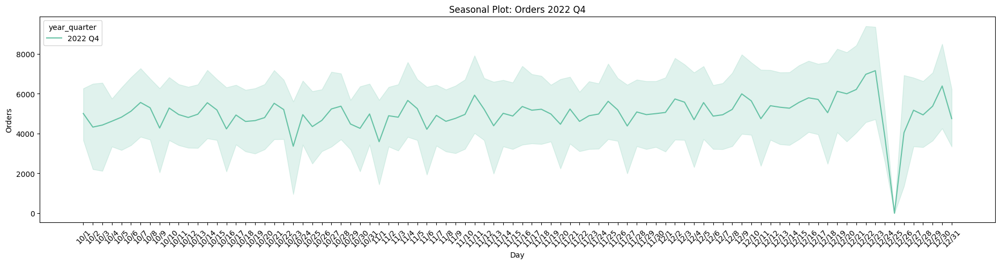

In [ ]:
fig, ax = plt.subplots(figsize=(23, 5))
train_subset = train[train['year_quarter'] == '2022 Q1']
ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
ax.set_title("Seasonal Plot: Orders 2022 Q1")
ax.set_xlabel("Day")
ax.set_ylabel("Orders")
ax.tick_params(axis='x', labelrotation=45)
fig.show()

fig, ax = plt.subplots(figsize=(23, 5))
train_subset = train[train['year_quarter'] == '2022 Q2']
ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
ax.set_title("Seasonal Plot: Orders 2022 Q2")
ax.set_xlabel("Day")
ax.set_ylabel("Orders")
ax.tick_params(axis='x', labelrotation=45)
fig.show()

fig, ax = plt.subplots(figsize=(23, 5))
train_subset = train[train['year_quarter'] == '2022 Q3']
ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
ax.set_title("Seasonal Plot: Orders 2022 Q3")
ax.set_xlabel("Day")
ax.set_ylabel("Orders")
ax.tick_params(axis='x', labelrotation=45)
fig.show()

fig, ax = plt.subplots(figsize=(23, 5))
train_subset = train[train['year_quarter'] == '2022 Q4']
ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
ax.set_title("Seasonal Plot: Orders 2022 Q4")
ax.set_xlabel("Day")
ax.set_ylabel("Orders")
ax.tick_params(axis='x', labelrotation=45)
fig.show()

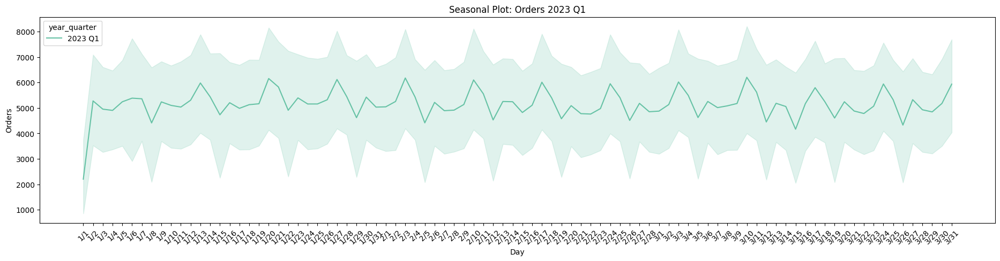

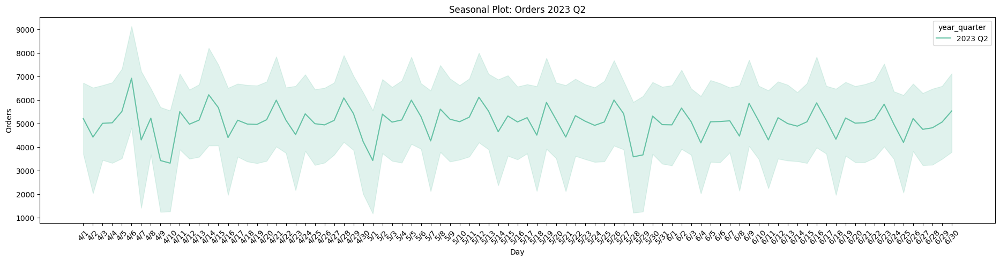

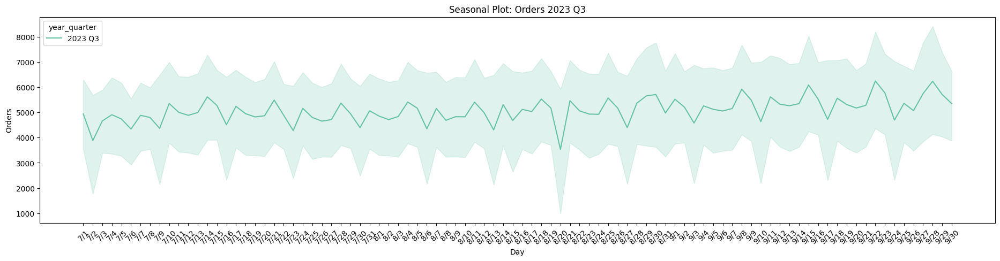

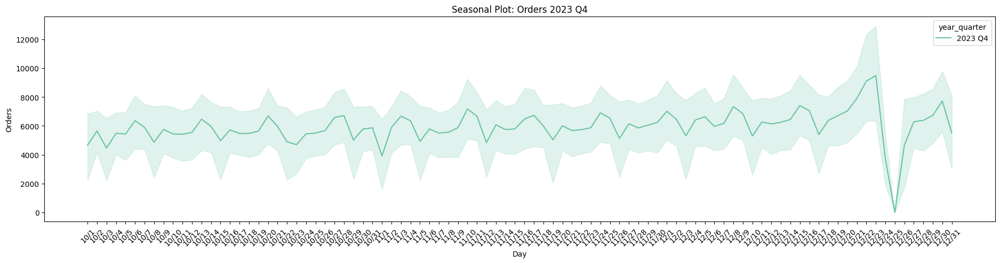

In [ ]:
fig, ax = plt.subplots(figsize=(23, 5))
train_subset = train[train['year_quarter'] == '2023 Q1']
ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
ax.set_title("Seasonal Plot: Orders 2023 Q1")
ax.set_xlabel("Day")
ax.set_ylabel("Orders")
ax.tick_params(axis='x', labelrotation=45)
fig.show()

fig, ax = plt.subplots(figsize=(23, 5))
train_subset = train[train['year_quarter'] == '2023 Q2']
ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
ax.set_title("Seasonal Plot: Orders 2023 Q2")
ax.set_xlabel("Day")
ax.set_ylabel("Orders")
ax.tick_params(axis='x', labelrotation=45)
fig.show()

fig, ax = plt.subplots(figsize=(23, 5))
train_subset = train[train['year_quarter'] == '2023 Q3']
ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
ax.set_title("Seasonal Plot: Orders 2023 Q3")
ax.set_xlabel("Day")
ax.set_ylabel("Orders")
ax.tick_params(axis='x', labelrotation=45)
fig.show()

fig, ax = plt.subplots(figsize=(23, 5))
train_subset = train[train['year_quarter'] == '2023 Q4']
ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
ax.set_title("Seasonal Plot: Orders 2023 Q4")
ax.set_xlabel("Day")
ax.set_ylabel("Orders")
ax.tick_params(axis='x', labelrotation=45)
fig.show()

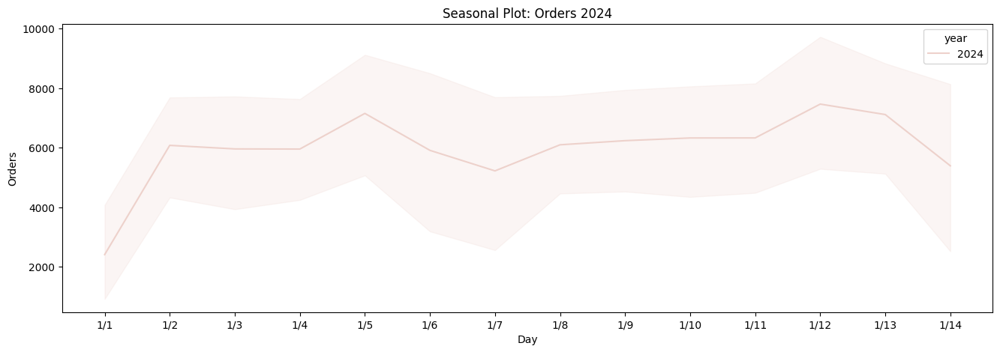

In [ ]:
fig, ax = plt.subplots(figsize=(16, 5))
train_subset = train[train['year'] == 2024]
ax = sns.lineplot(data=train_subset, x='month_day',y='orders', ax=ax, hue='year')
ax.set_title("Seasonal Plot: Orders 2024")
ax.set_xlabel("Day")
ax.set_ylabel("Orders")
fig.show()

## By warehouse

In [ ]:
warehouses = train['warehouse'].unique()
warehouses

array(['Brno_1', 'Frankfurt_1', 'Prague_2', 'Prague_1', 'Prague_3',
       'Munich_1', 'Budapest_1'], dtype=object)

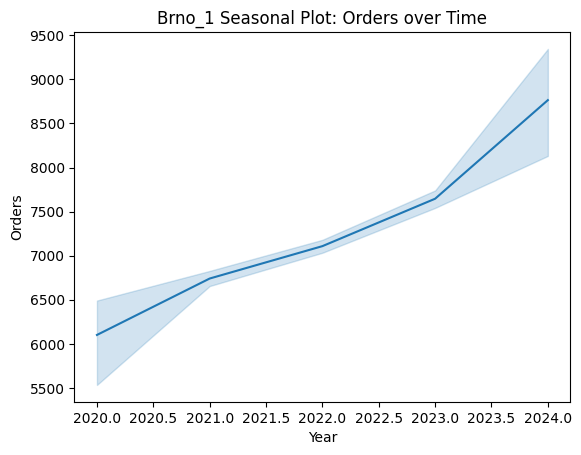

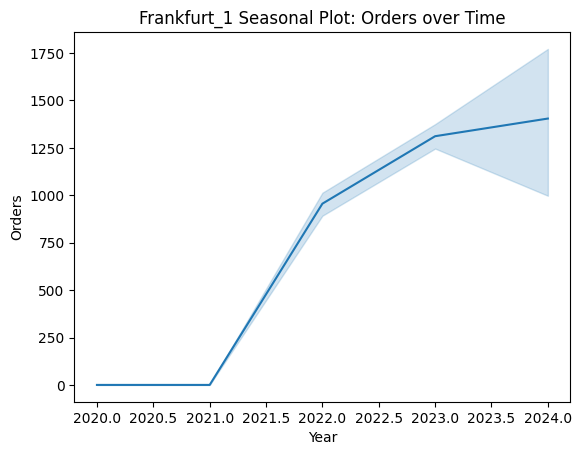

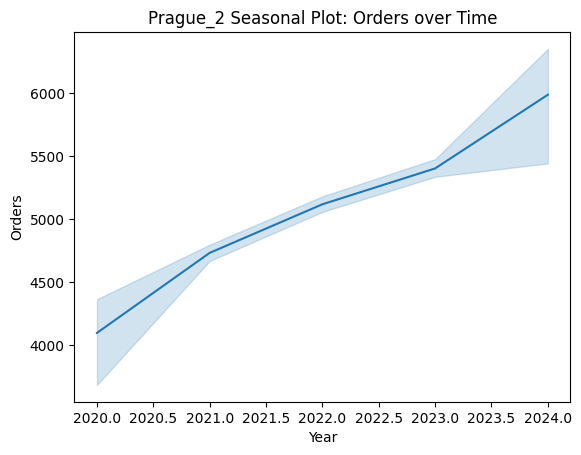

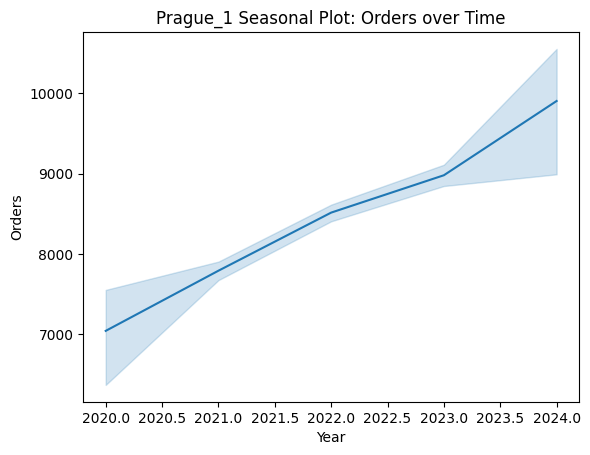

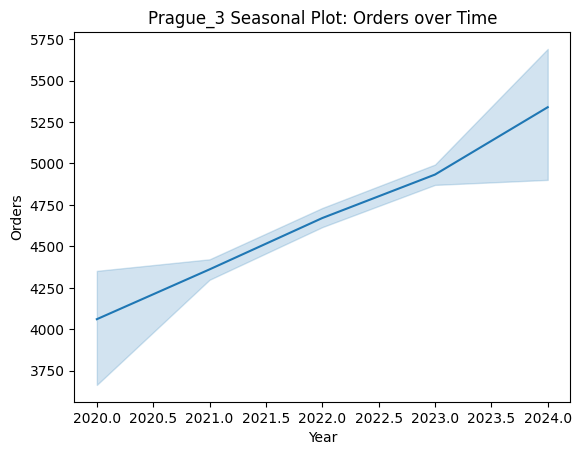

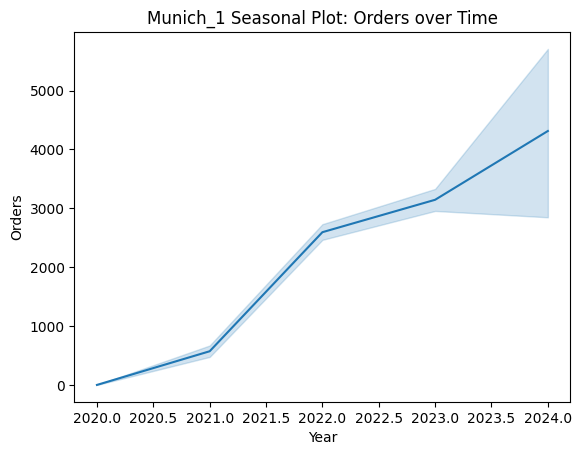

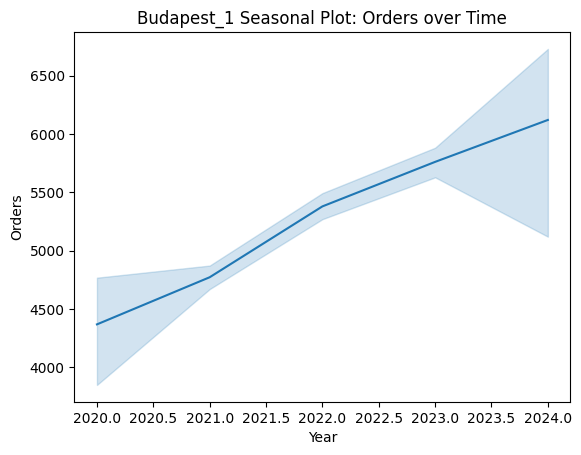

In [ ]:
for w in warehouses:
  train_subset = train[train['warehouse'] == w]
  fig, ax = plt.subplots()
  ax = sns.lineplot(data=train_subset, x='year',y='orders')
  ax.set_title(f"{w} Seasonal Plot: Orders over Time")
  ax.set_xlabel("Year")
  ax.set_ylabel("Orders")
  fig.show()

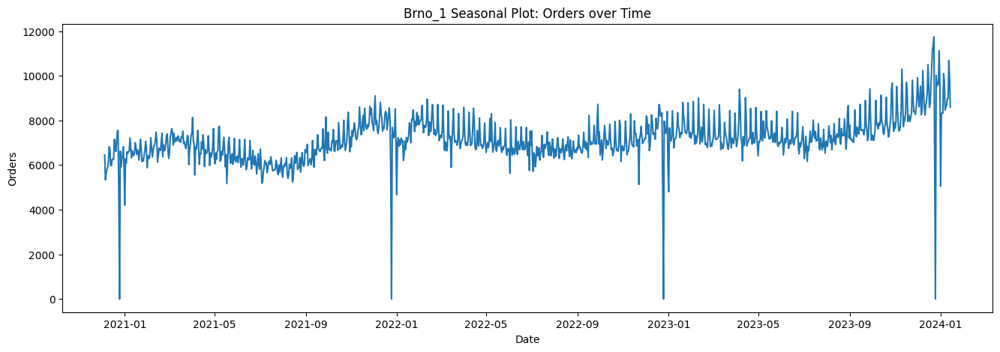

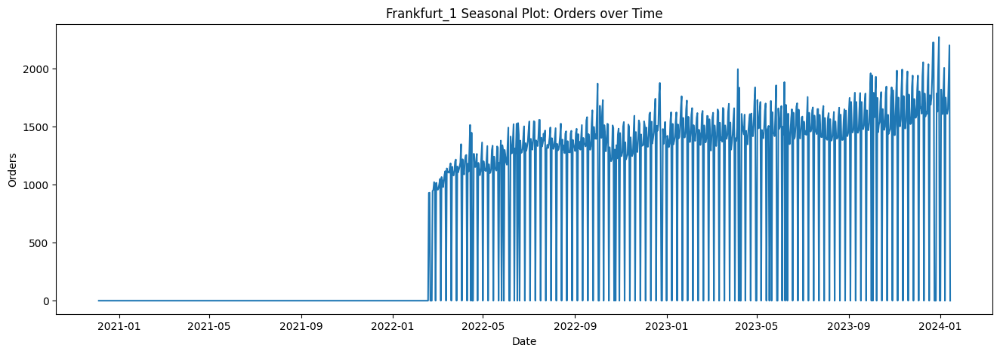

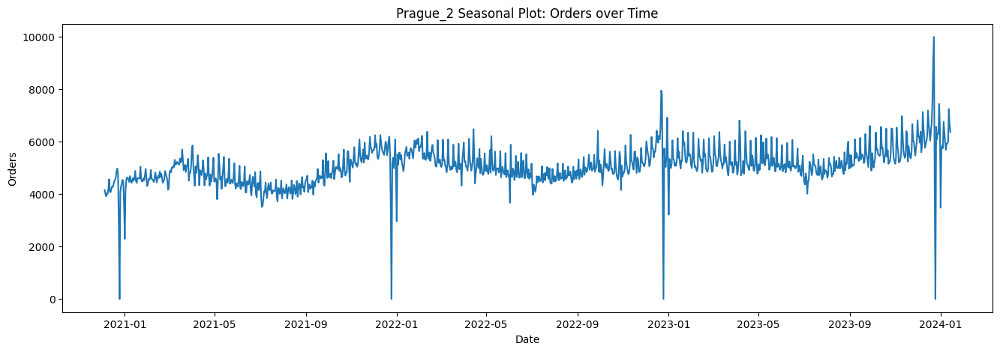

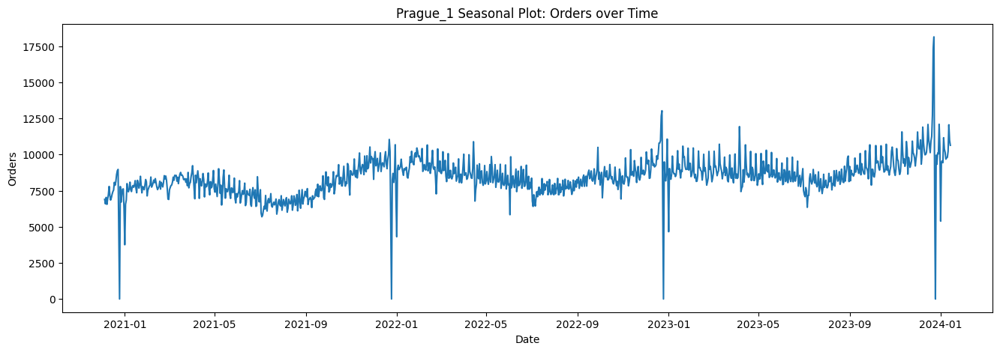

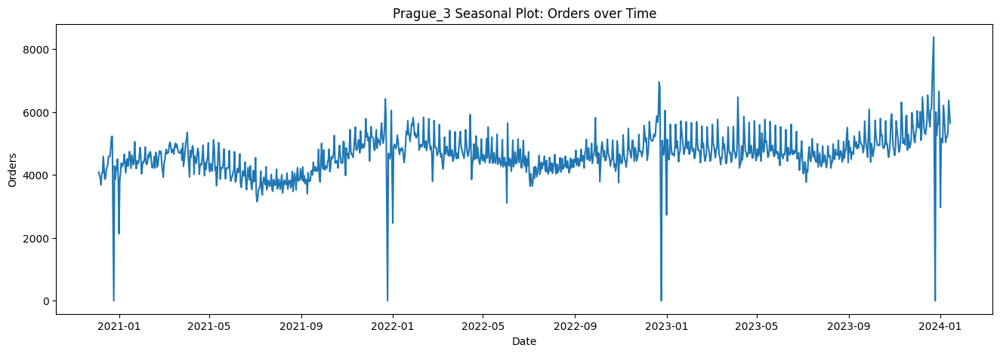

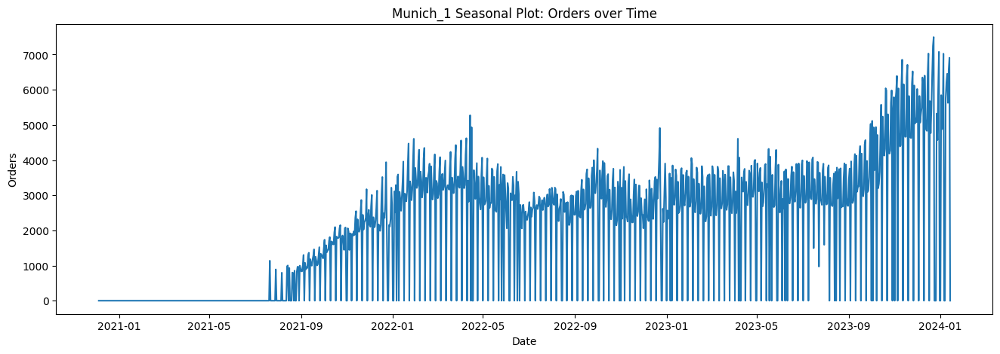

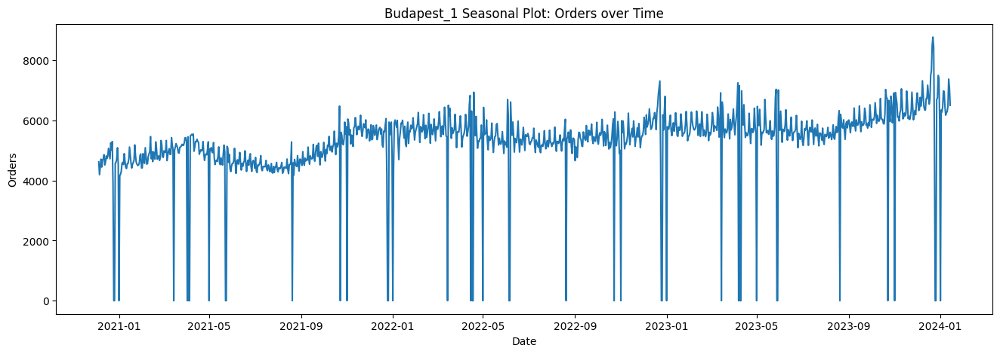

In [ ]:
for w in warehouses:
  train_subset = train[train['warehouse'] == w]
  fig, ax = plt.subplots(figsize=(16, 5))
  ax = sns.lineplot(data=train_subset, x='date',y='orders',ax=ax)
  ax.set_title(f"{w} Seasonal Plot: Orders over Time")
  ax.set_xlabel("Date")
  ax.set_ylabel("Orders")
  fig.show()


The orders over time varies greatly based on the warehouse, so we will create separate models for each warehouse.

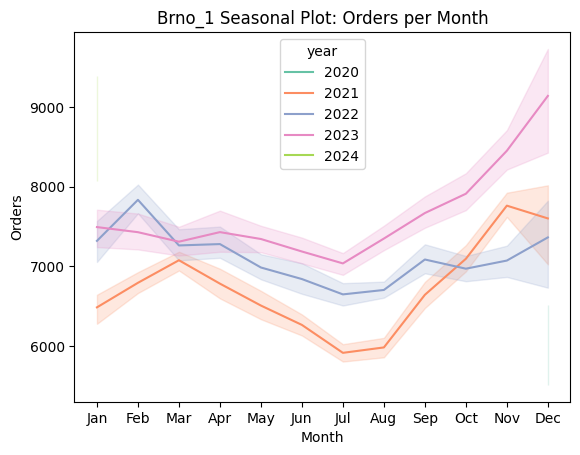

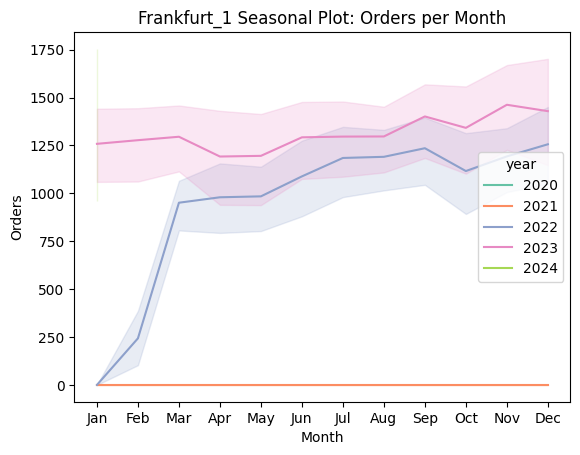

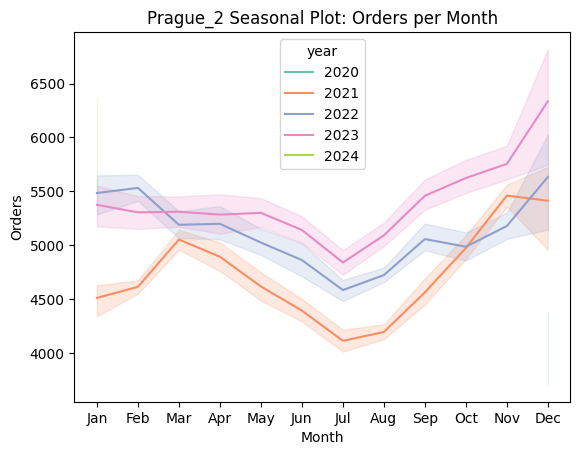

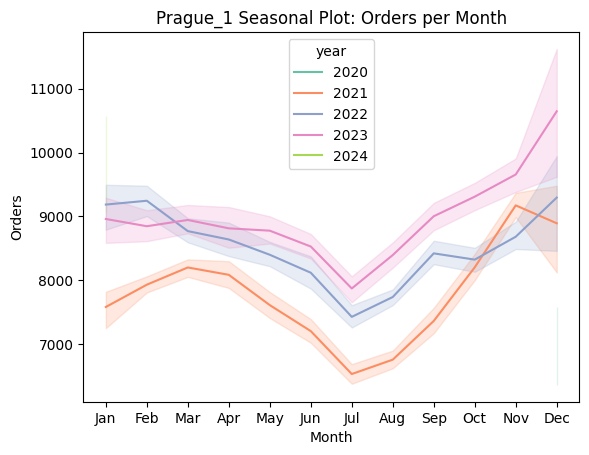

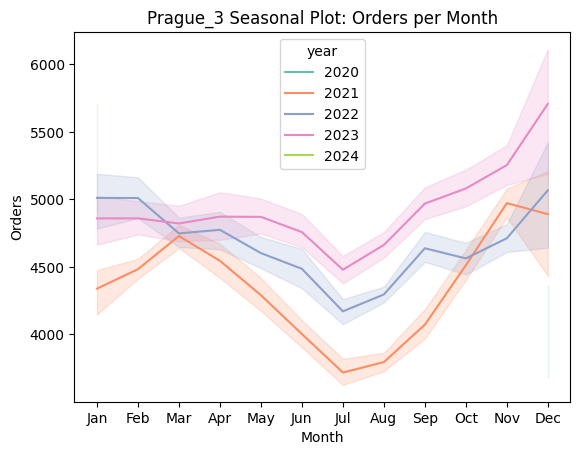

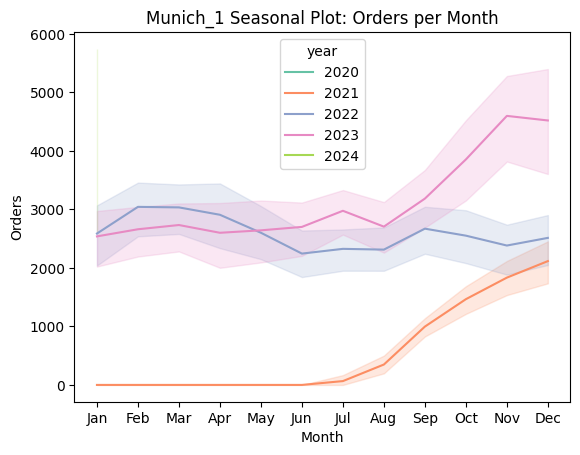

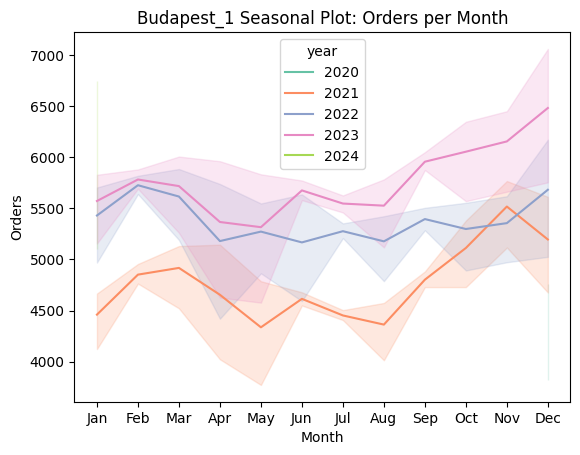

In [ ]:
for w in warehouses:
  train_subset = train[train['warehouse'] == w]
  fig, ax = plt.subplots()
  ax = sns.lineplot(data=train_subset, x='month',y='orders', hue='year', palette="Set2")
  ax.set_xticks(ticks=range(1, 13),
    labels=["Jan", "Feb", "Mar", "Apr", "May", "Jun",
            "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"],
  )
  ax.set_title(f"{w} Seasonal Plot: Orders per Month")
  ax.set_xlabel("Month")
  ax.set_ylabel("Orders")
  fig.show()

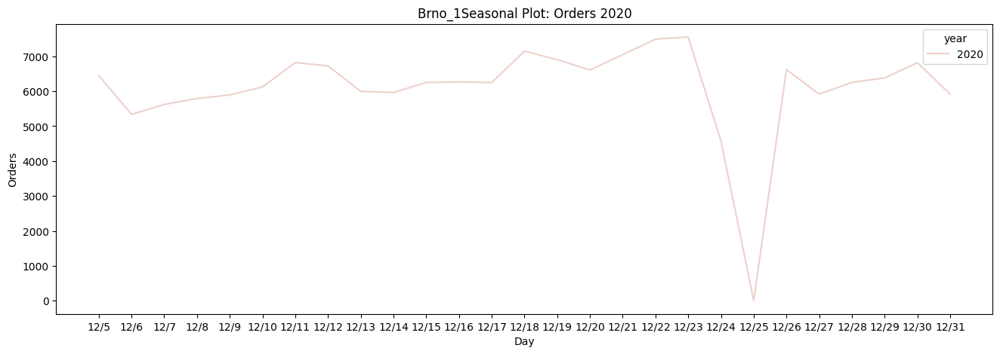

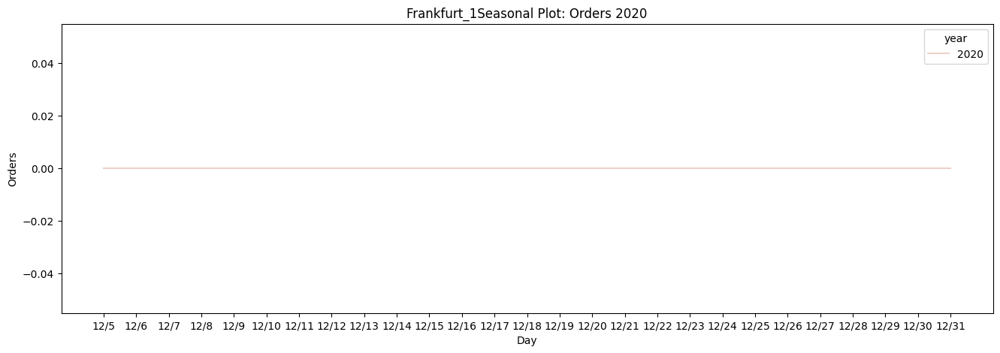

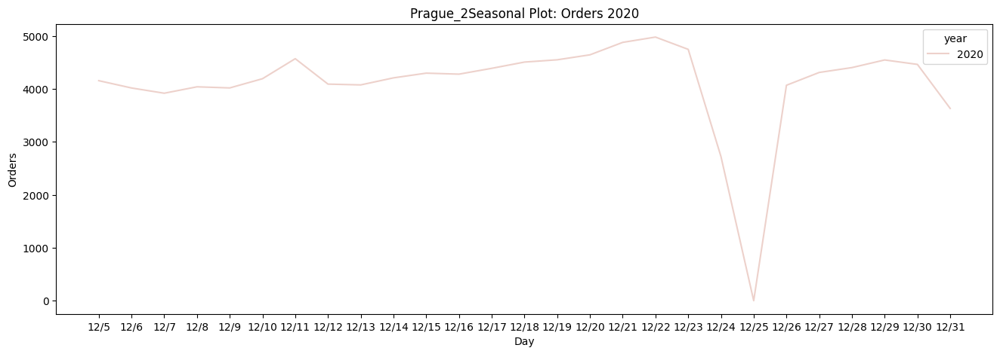

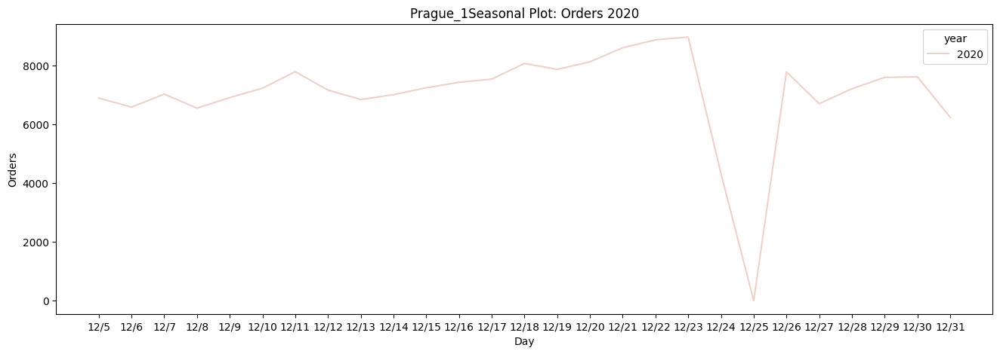

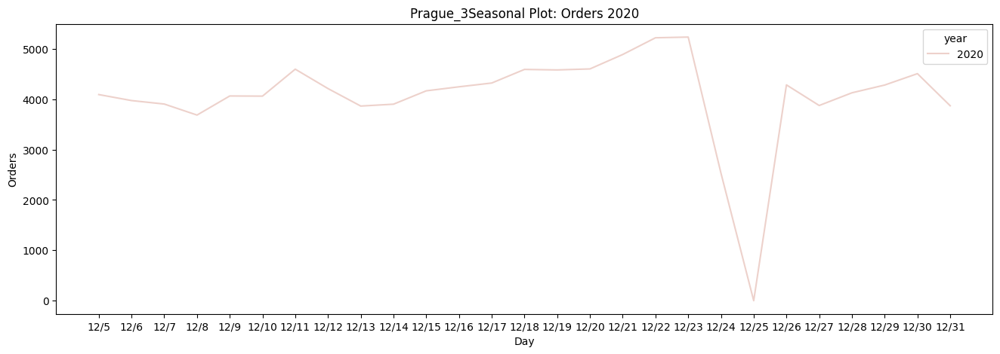

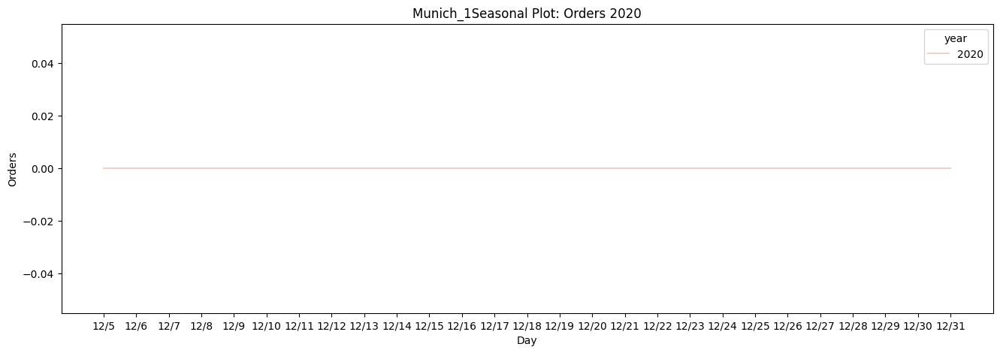

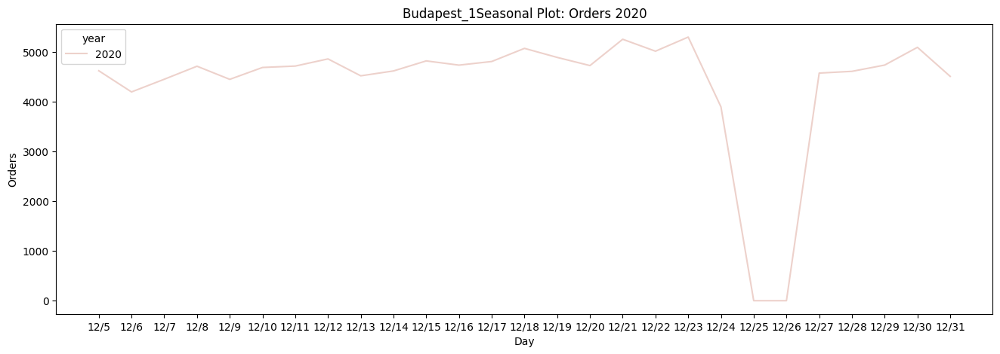

In [ ]:
for w in warehouses:
  train_subset = train[train['warehouse'] == w]
  fig, ax = plt.subplots(figsize=(16, 5))
  train_subset = train_subset[train_subset['year'] == 2020]
  ax = sns.lineplot(data=train_subset, x='month_day',y='orders', ax=ax, hue='year')
  ax.set_title(f"{w}Seasonal Plot: Orders 2020")
  ax.set_xlabel("Day")
  ax.set_ylabel("Orders")
  fig.show()

/tmp/ipython-input-1415735578.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(23, 5))


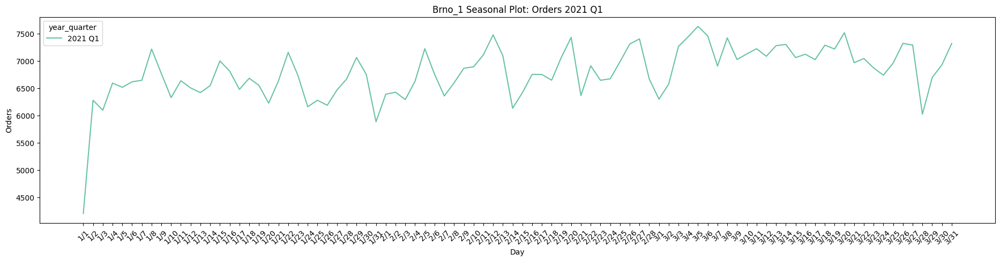

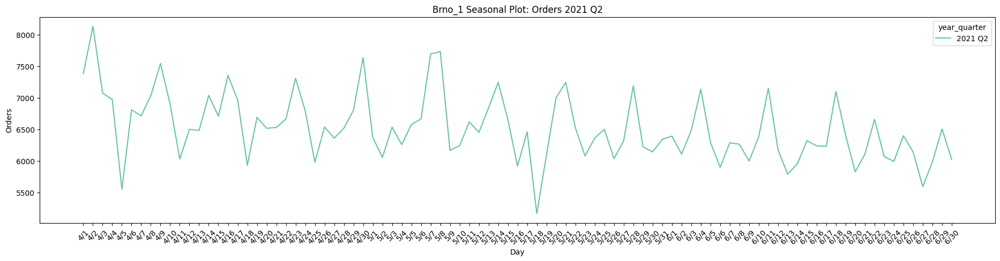

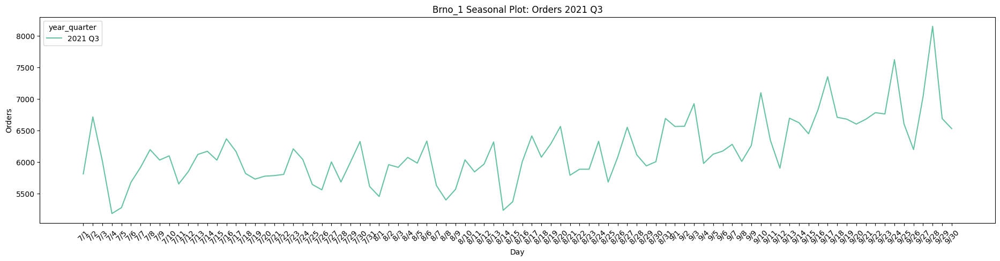

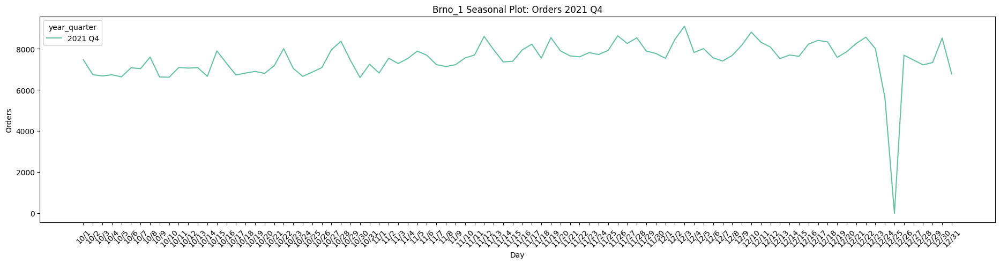

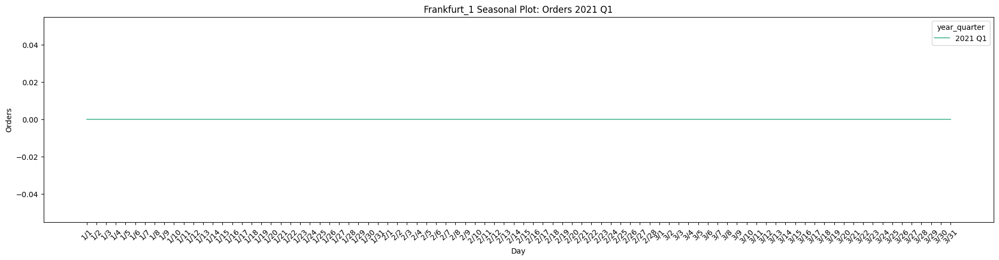

...

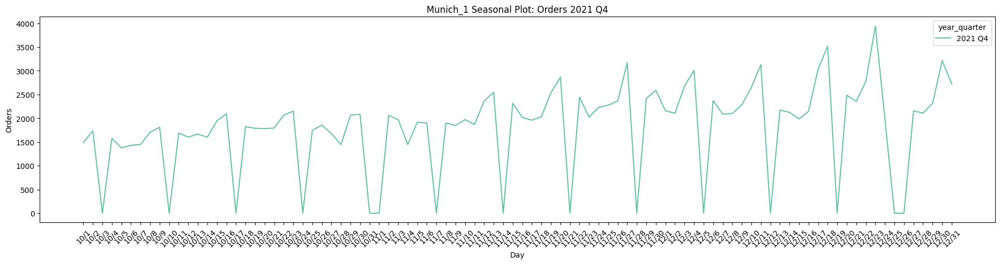

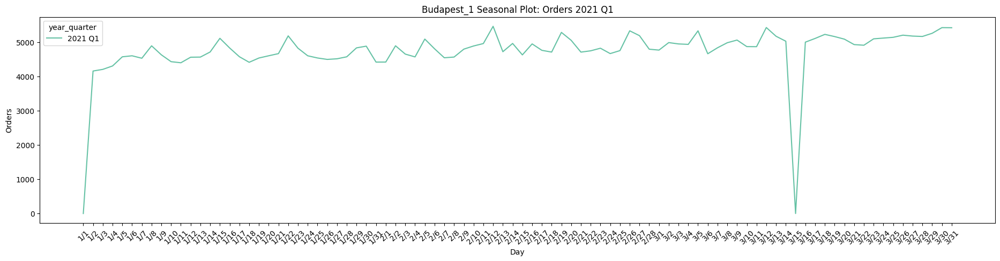

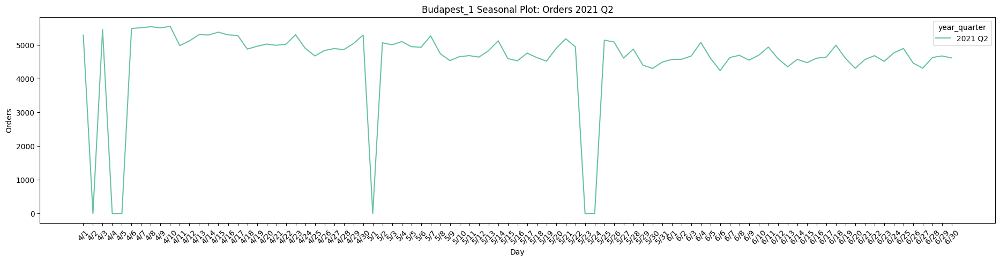

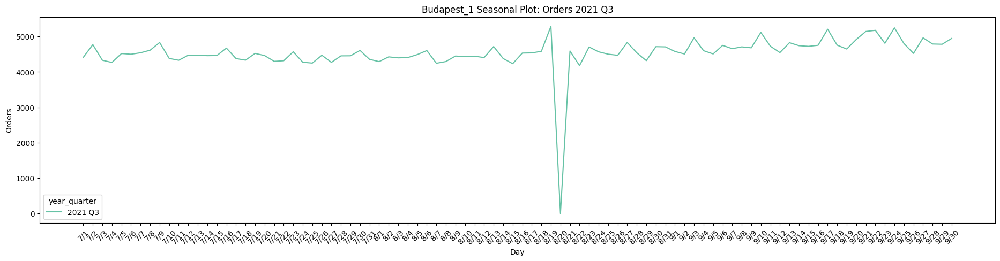

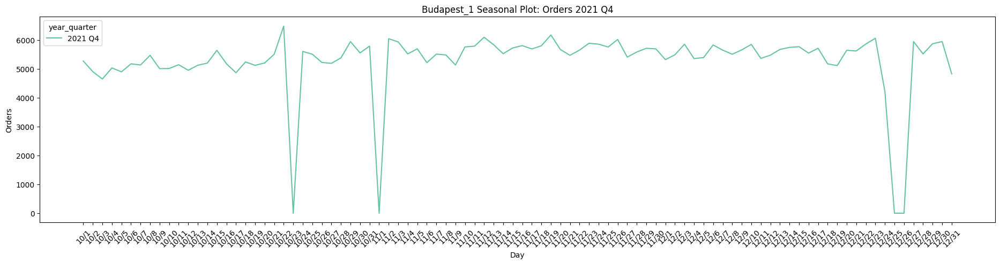

In [ ]:
for w in warehouses:
  fig, ax = plt.subplots(figsize=(23, 5))
  train_subset = train[(train['year_quarter'] == '2021 Q1') & (train['warehouse'] == w)]
  ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
  ax.set_title(f"{w} Seasonal Plot: Orders 2021 Q1")
  ax.set_xlabel("Day")
  ax.set_ylabel("Orders")
  ax.tick_params(axis='x', labelrotation=45)
  fig.show()

  fig, ax = plt.subplots(figsize=(23, 5))
  train_subset = train[(train['year_quarter'] == '2021 Q2') & (train['warehouse'] == w)]
  ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
  ax.set_title(f"{w} Seasonal Plot: Orders 2021 Q2")
  ax.set_xlabel("Day")
  ax.set_ylabel("Orders")
  ax.tick_params(axis='x', labelrotation=45)
  fig.show()

  fig, ax = plt.subplots(figsize=(23, 5))
  train_subset = train[(train['year_quarter'] == '2021 Q3') & (train['warehouse'] == w)]
  ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
  ax.set_title(f"{w} Seasonal Plot: Orders 2021 Q3")
  ax.set_xlabel("Day")
  ax.set_ylabel("Orders")
  ax.tick_params(axis='x', labelrotation=45)
  fig.show()

  fig, ax = plt.subplots(figsize=(23, 5))
  train_subset = train[(train['year_quarter'] == '2021 Q4') & (train['warehouse'] == w)]
  ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
  ax.set_title(f"{w} Seasonal Plot: Orders 2021 Q4")
  ax.set_xlabel("Day")
  ax.set_ylabel("Orders")
  ax.tick_params(axis='x', labelrotation=45)
  fig.show()

/tmp/ipython-input-3854079329.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(23, 5))


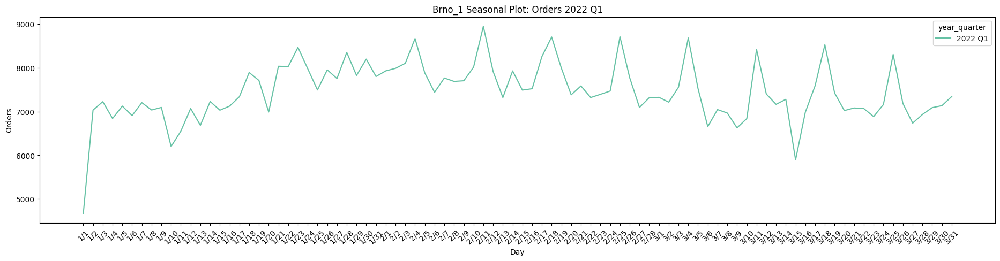

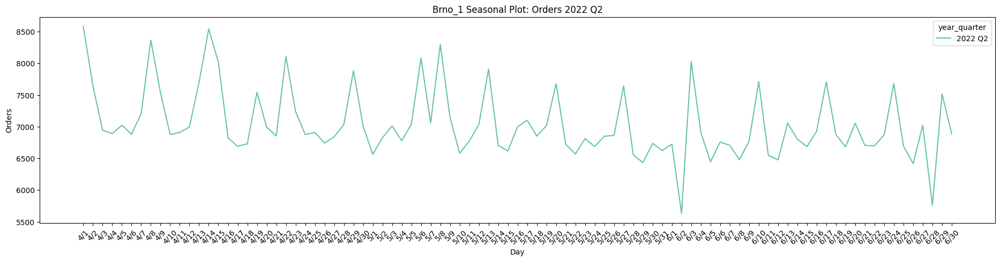

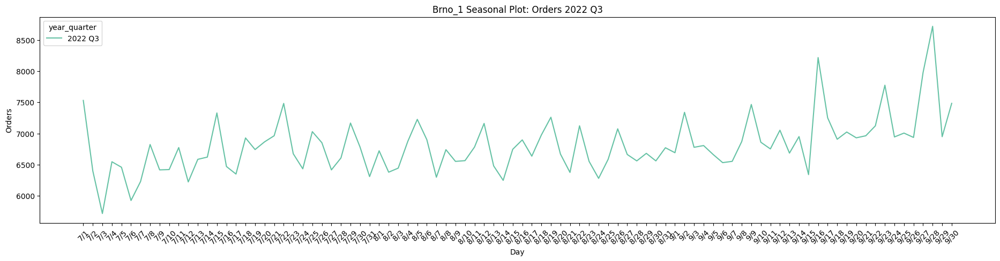

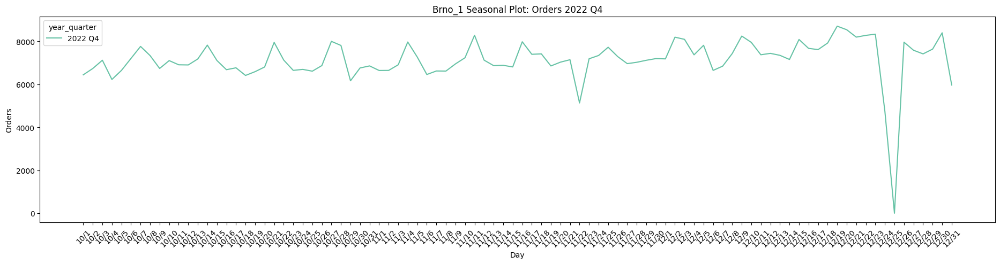

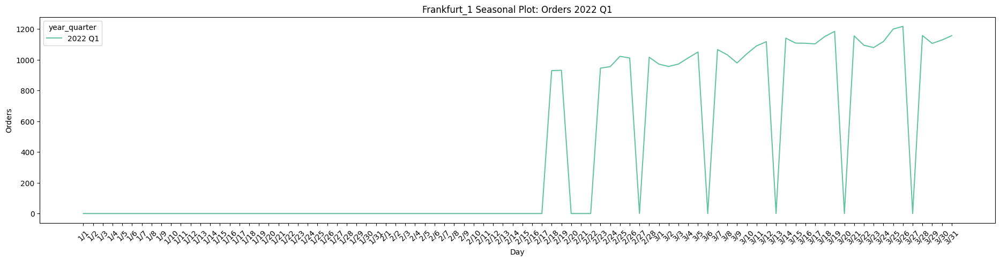

...

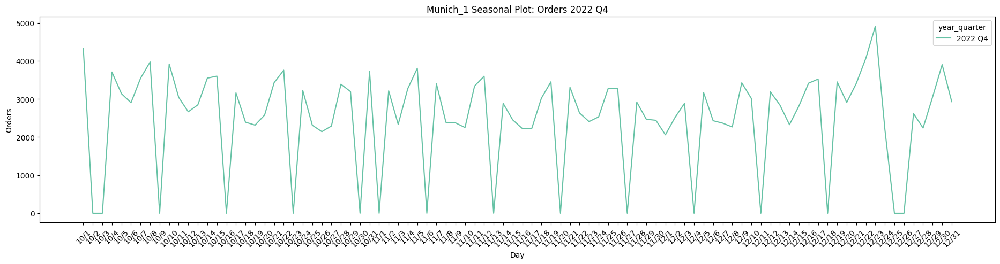

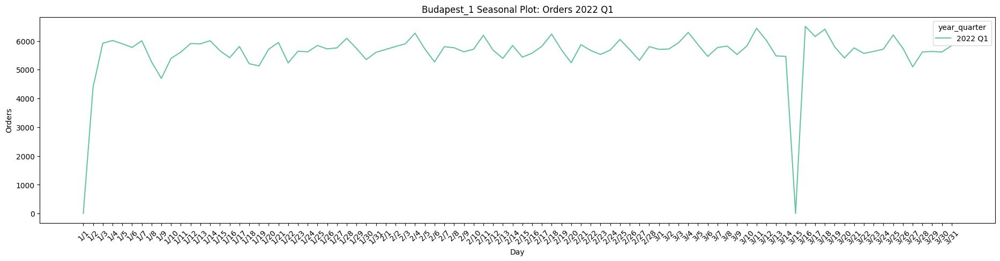

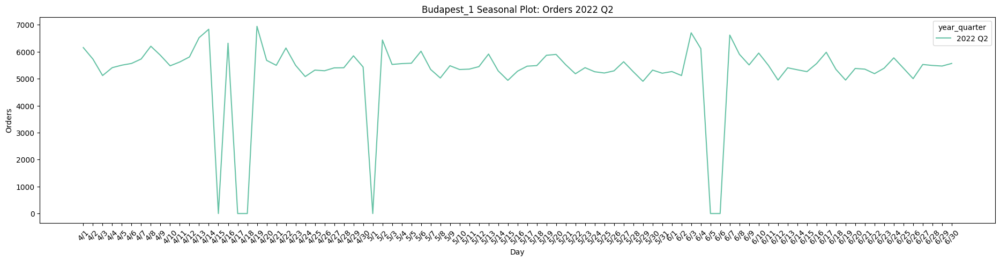

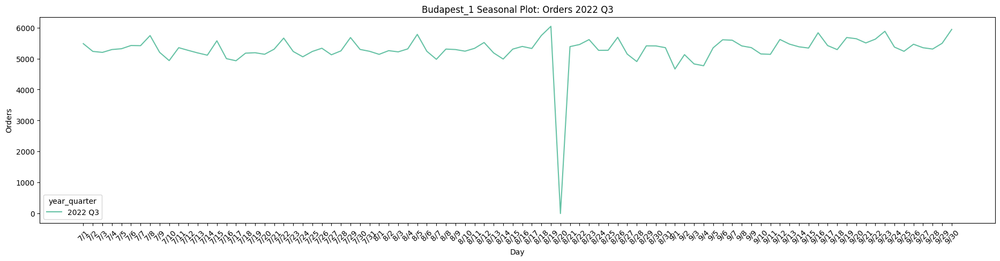

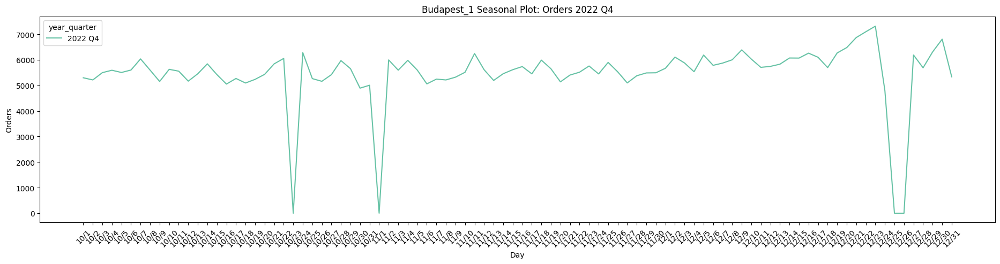

In [ ]:
for w in warehouses:
  fig, ax = plt.subplots(figsize=(23, 5))
  train_subset = train[(train['year_quarter'] == '2022 Q1') & (train['warehouse'] == w)]
  ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
  ax.set_title(f"{w} Seasonal Plot: Orders 2022 Q1")
  ax.set_xlabel("Day")
  ax.set_ylabel("Orders")
  ax.tick_params(axis='x', labelrotation=45)
  fig.show()

  fig, ax = plt.subplots(figsize=(23, 5))
  train_subset = train[(train['year_quarter'] == '2022 Q2') & (train['warehouse'] == w)]
  ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
  ax.set_title(f"{w} Seasonal Plot: Orders 2022 Q2")
  ax.set_xlabel("Day")
  ax.set_ylabel("Orders")
  ax.tick_params(axis='x', labelrotation=45)
  fig.show()

  fig, ax = plt.subplots(figsize=(23, 5))
  train_subset = train[(train['year_quarter'] == '2022 Q3') & (train['warehouse'] == w)]
  ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
  ax.set_title(f"{w} Seasonal Plot: Orders 2022 Q3")
  ax.set_xlabel("Day")
  ax.set_ylabel("Orders")
  ax.tick_params(axis='x', labelrotation=45)
  fig.show()

  fig, ax = plt.subplots(figsize=(23, 5))
  train_subset = train[(train['year_quarter'] == '2022 Q4') & (train['warehouse'] == w)]
  ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
  ax.set_title(f"{w} Seasonal Plot: Orders 2022 Q4")
  ax.set_xlabel("Day")
  ax.set_ylabel("Orders")
  ax.tick_params(axis='x', labelrotation=45)
  fig.show()

/tmp/ipython-input-4086028830.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(23, 5))


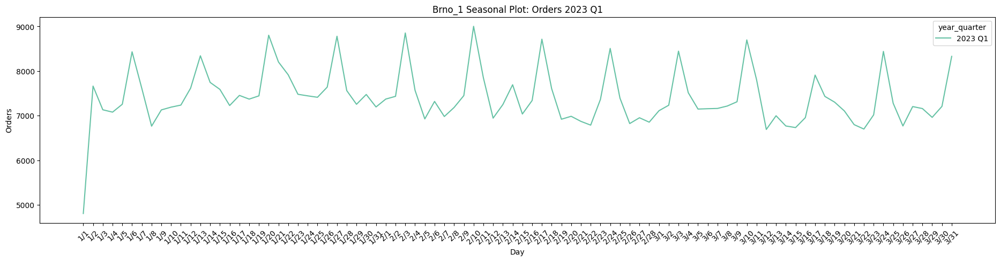

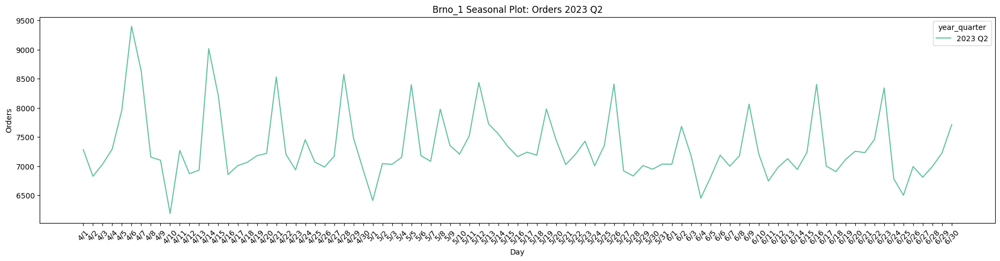

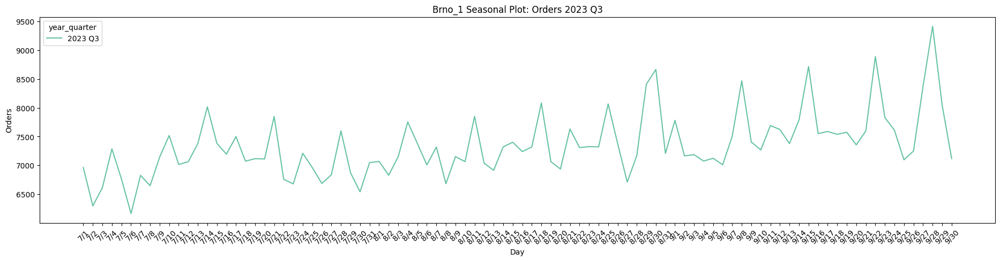

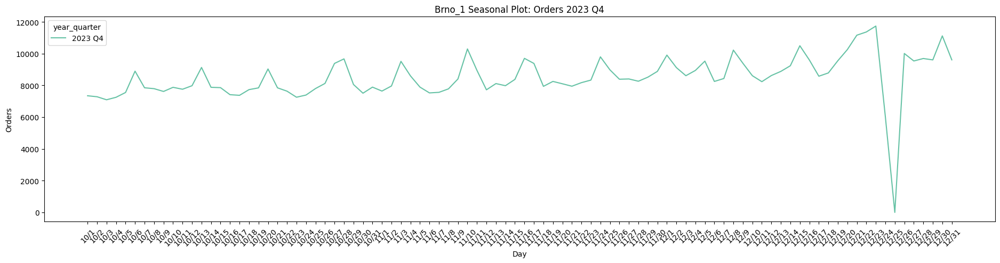

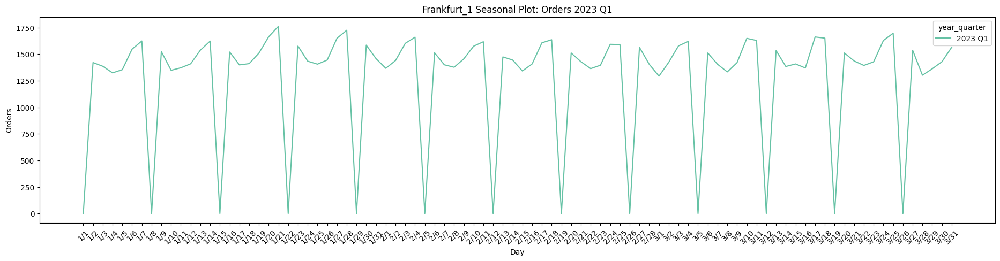

...

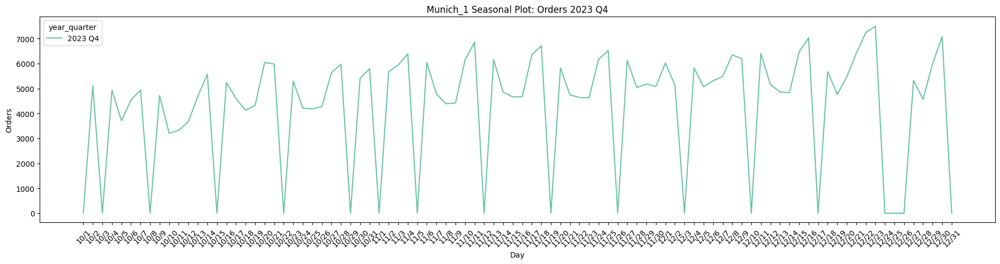

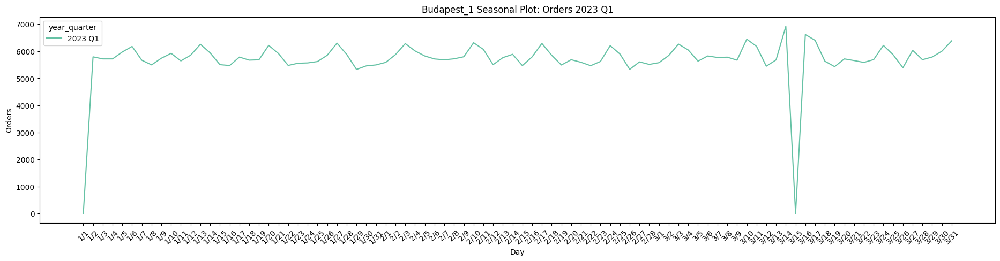

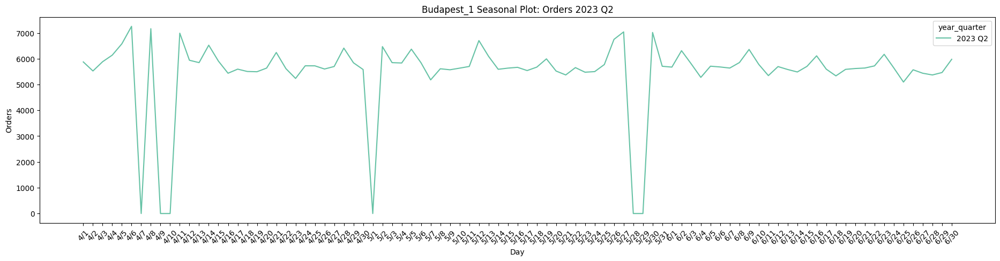

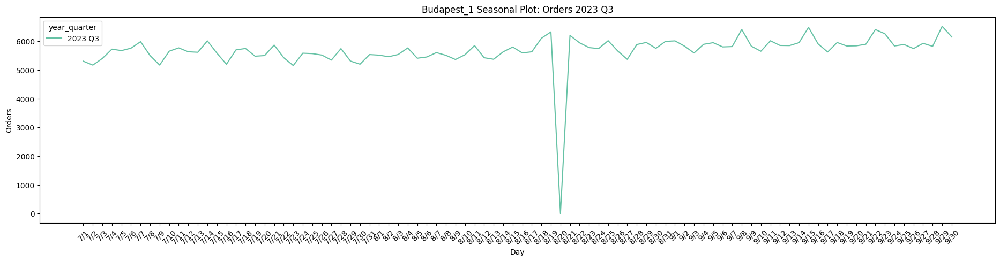

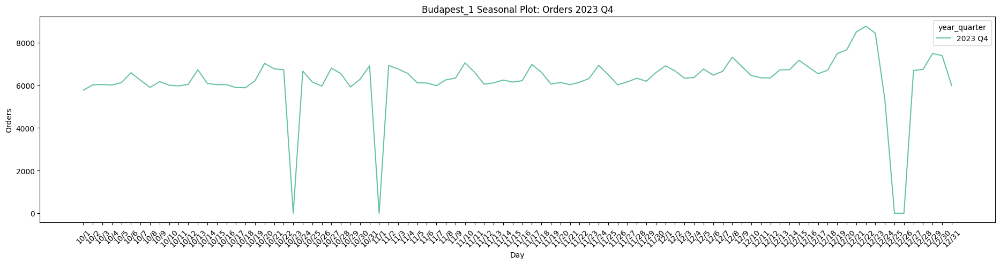

In [ ]:
for w in warehouses:
  fig, ax = plt.subplots(figsize=(23, 5))
  train_subset = train[(train['year_quarter'] == '2023 Q1') & (train['warehouse'] == w)]
  ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
  ax.set_title(f"{w} Seasonal Plot: Orders 2023 Q1")
  ax.set_xlabel("Day")
  ax.set_ylabel("Orders")
  ax.tick_params(axis='x', labelrotation=45)
  fig.show()

  fig, ax = plt.subplots(figsize=(23, 5))
  train_subset = train[(train['year_quarter'] == '2023 Q2') & (train['warehouse'] == w)]
  ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
  ax.set_title(f"{w} Seasonal Plot: Orders 2023 Q2")
  ax.set_xlabel("Day")
  ax.set_ylabel("Orders")
  ax.tick_params(axis='x', labelrotation=45)
  fig.show()

  fig, ax = plt.subplots(figsize=(23, 5))
  train_subset = train[(train['year_quarter'] == '2023 Q3') & (train['warehouse'] == w)]
  ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
  ax.set_title(f"{w} Seasonal Plot: Orders 2023 Q3")
  ax.set_xlabel("Day")
  ax.set_ylabel("Orders")
  ax.tick_params(axis='x', labelrotation=45)
  fig.show()

  fig, ax = plt.subplots(figsize=(23, 5))
  train_subset = train[(train['year_quarter'] == '2023 Q4') & (train['warehouse'] == w)]
  ax = sns.lineplot(data=train_subset, x='month_day',y='orders', hue='year_quarter', palette="Set2", ax=ax)
  ax.set_title(f"{w} Seasonal Plot: Orders 2023 Q4")
  ax.set_xlabel("Day")
  ax.set_ylabel("Orders")
  ax.tick_params(axis='x', labelrotation=45)
  fig.show()

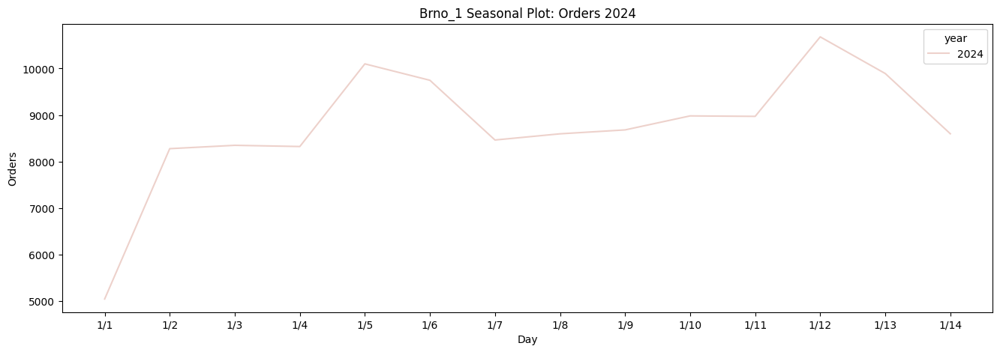

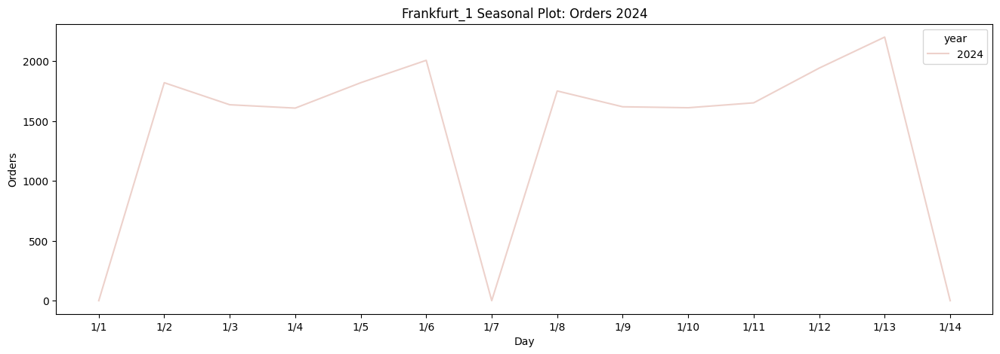

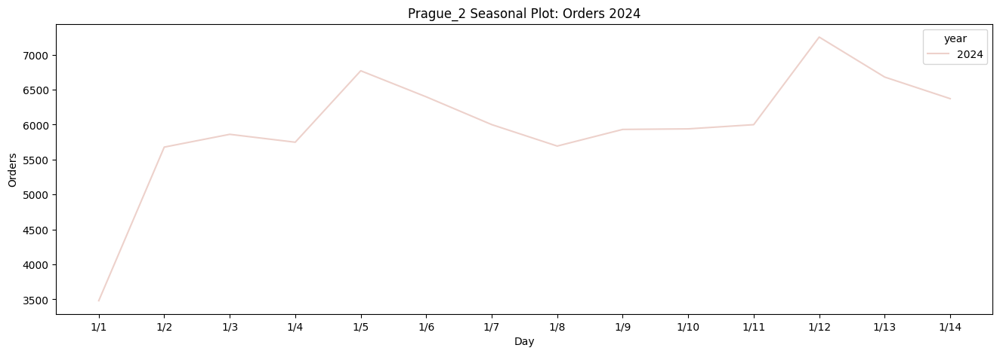

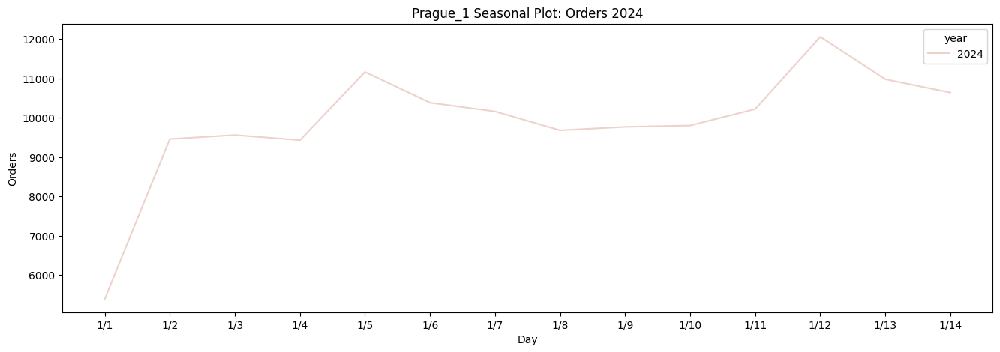

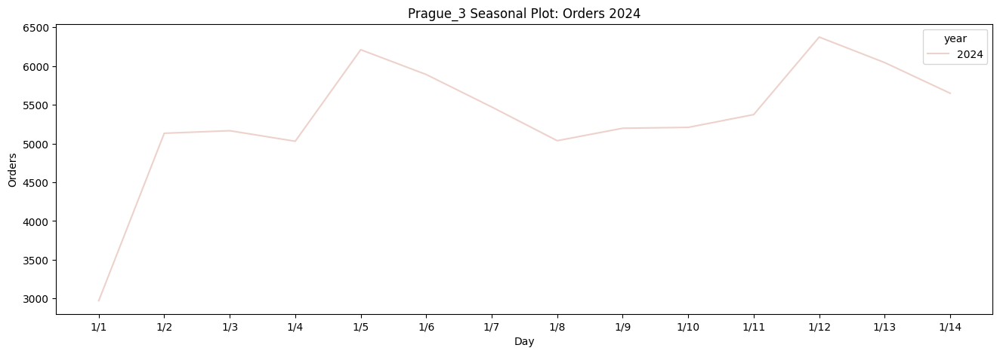

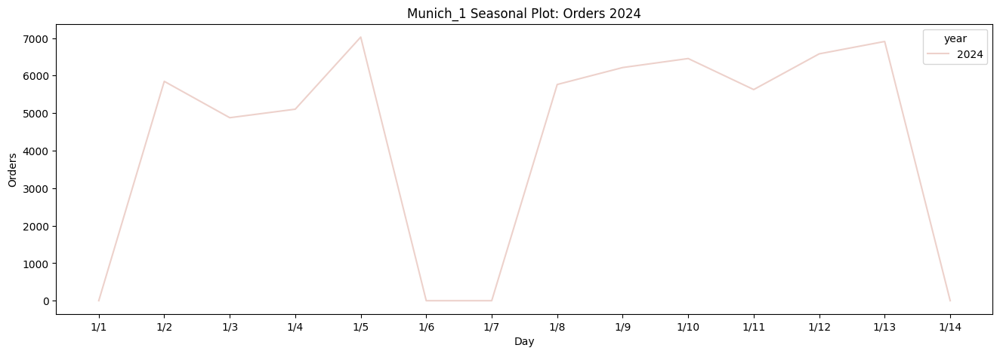

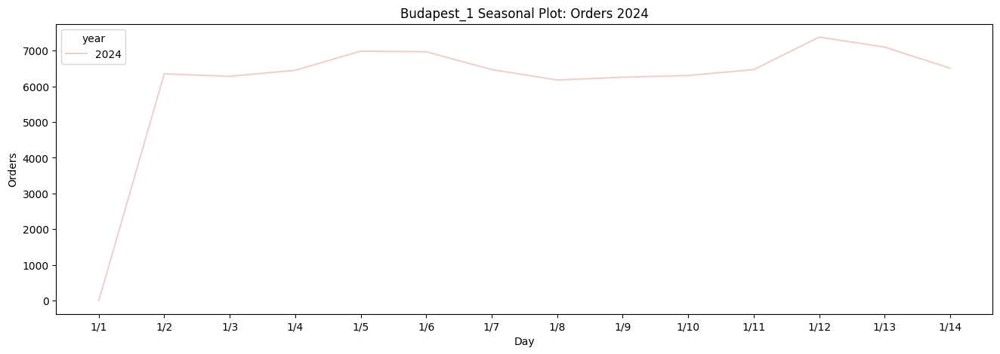

In [ ]:
for w in warehouses:
  fig, ax = plt.subplots(figsize=(16, 5))
  train_subset = train[(train['year'] == 2024) & (train['warehouse'] == w)]
  ax = sns.lineplot(data=train_subset, x='month_day',y='orders', ax=ax, hue='year')
  ax.set_title(f"{w} Seasonal Plot: Orders 2024")
  ax.set_xlabel("Day")
  ax.set_ylabel("Orders")
  fig.show()

## Understand nonregular days

In [ ]:
zero_orders = train[train['orders'] == 0]
zero_orders

,date,holiday_name,holiday,shutdown,mini_shutdown,warehouse_limited,shops_closed,winter_school_holidays,school_holidays,blackout,...,id,weekday_name,day,hour,month,month_name,year,quarter,year_quarter,month_day
10532,2020-12-05,NaN,0,0,0,0,0,0,0,0,...,NaN,Saturday,5,0,12,December,2020,Q4,2020 Q4,12/5
7937,2020-12-05,NaN,0,0,0,0,0,0,0,0,...,NaN,Saturday,5,0,12,December,2020,Q4,2020 Q4,12/5
9565,2020-12-06,NaN,0,0,0,0,0,0,0,0,...,NaN,Sunday,6,0,12,December,2020,Q4,2020 Q4,12/6
9133,2020-12-06,NaN,0,0,0,0,0,0,0,0,...,NaN,Sunday,6,0,12,December,2020,Q4,2020 Q4,12/6
9623,2020-12-07,NaN,0,0,0,0,0,0,0,0,...,NaN,Monday,7,0,12,December,2020,Q4,2020 Q4,12/7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8656,2024-01-06,Epiphany,1,0,0,0,1,0,0,0,...,NaN,Saturday,6,0,1,January,2024,Q1,2024 Q1,1/6
8252,2024-01-07,NaN,0,0,0,0,0,0,0,0,...,NaN,Sunday,7,0,1,January,2024,Q1,2024 Q1,1/7
10528,2024-01-07,NaN,0,0,0,0,0,1,0,0,...,NaN,Sunday,7,0,1,January,2024,Q1,2024 Q1,1/7
9659,2024-01-14,NaN,0,0,0,0,0,0,0,0,...,NaN,Sunday,14,0,1,January,2024,Q1,2024 Q1,1/14


In [ ]:
for w in warehouses:
  zero_orders_subset = zero_orders[zero_orders['warehouse'] == w]
  display(zero_orders_subset.groupby(['warehouse', 'year', 'month_name'])['date'].count())

warehouse  year  month_name
Brno_1     2020  December      1
           2021  December      1
           2022  December      1
           2023  December      1
Name: date, dtype: int64

warehouse    year  month_name
Frankfurt_1  2020  December      27
             2021  April         30
                   August        31
                   December      31
                   February      28
                   January       31
                   July          31
                   June          30
                   March         31
                   May           31
                   November      30
                   October       31
                   September     30
             2022  April          6
                   August         4
                   December       5
                   February      21
                   January       31
                   July           5
                   June           6
                   March          4
                   May            6
                   November       4
                   October        7
                   September      4
             2023  April          7
                   August         4
                   December       7
                   February       4
                   January        5
                   July           5
                   June           5
                   March          4
                   May            7
                   November       4
                   October        6
                   September      4
             2024  January        3
Name: date, dtype: int64

warehouse  year  month_name
Prague_2   2020  December      1
           2021  December      1
           2022  December      1
           2023  December      1
Name: date, dtype: int64

warehouse  year  month_name
Prague_1   2020  December      1
           2021  December      1
           2022  December      1
           2023  December      1
Name: date, dtype: int64

warehouse  year  month_name
Prague_3   2020  December      1
           2021  December      1
           2022  December      1
           2023  December      1
Name: date, dtype: int64

warehouse  year  month_name
Munich_1   2020  December      27
           2021  April         30
                 August        19
                 December       5
                 February      28
                 January       31
                 July          29
                 June          30
                 March         31
                 May           31
                 November       5
                 October        5
                 September      4
           2022  April          6
                 August         5
                 December       5
                 February       4
                 January        7
                 July           5
                 June           6
                 March          4
                 May            6
                 November       5
                 October        6
                 September      4
           2023  April          7
                 August         5
                 December       7
                 February       4
                 January        6
                 July           2
                 June           5
                 March          4
                 May            7
                 November       5
                 October        6
                 September      4
           2024  January        4
Name: date, dtype: int64

warehouse   year  month_name
Budapest_1  2020  December      2
            2021  April         3
                  August        1
                  December      2
                  January       1
                  March         1
                  May           3
                  November      1
                  October       1
            2022  April         3
                  August        1
                  December      2
                  January       1
                  June          2
                  March         1
                  May           1
                  November      1
                  October       1
            2023  April         3
                  August        1
                  December      2
                  January       1
                  March         1
                  May           3
                  November      1
                  October       1
            2024  January       1
Name: date, dtype: int64

### Autocorrelation and Partial Autocorrelation plots

Brno_1


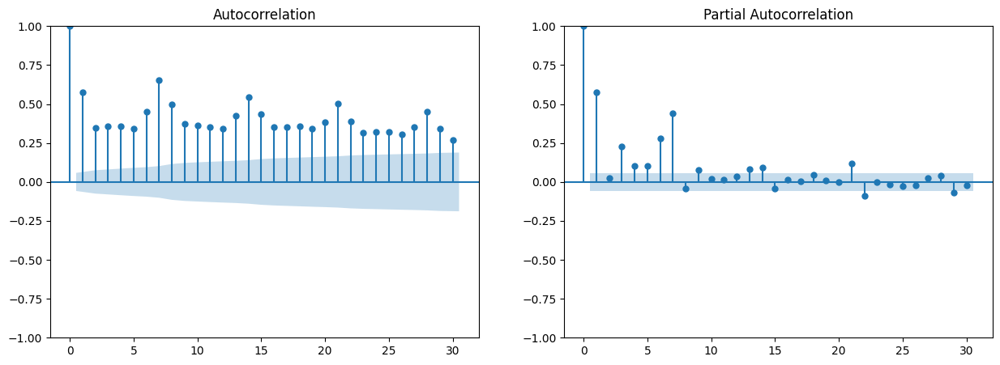

Frankfurt_1


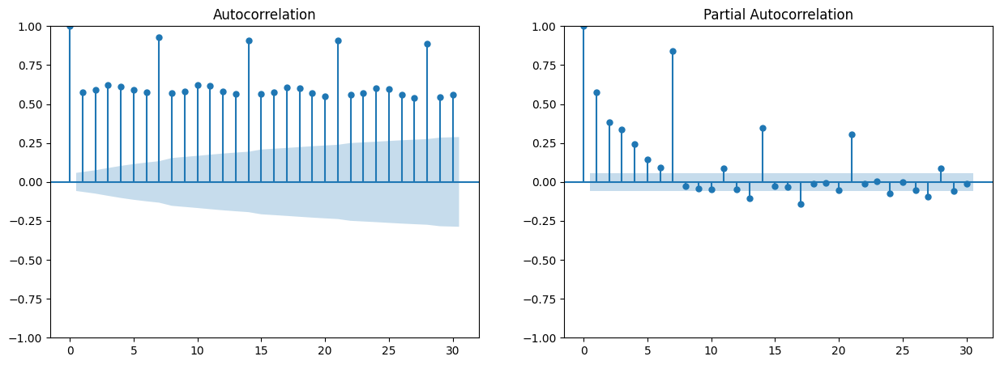

Prague_2


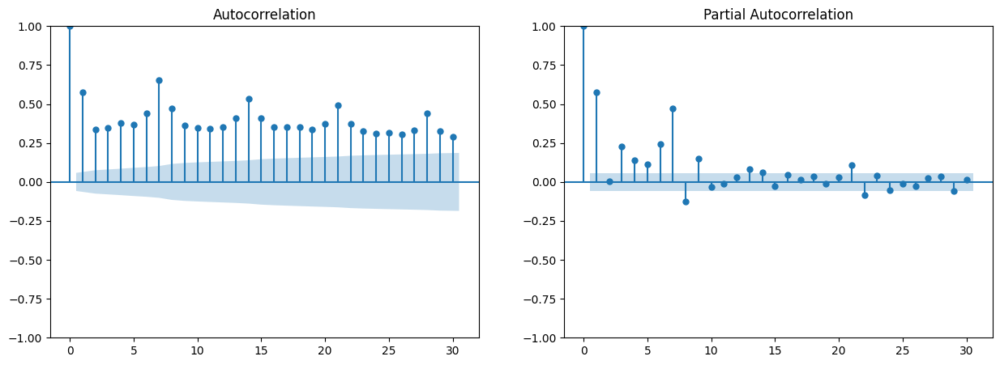

Prague_1


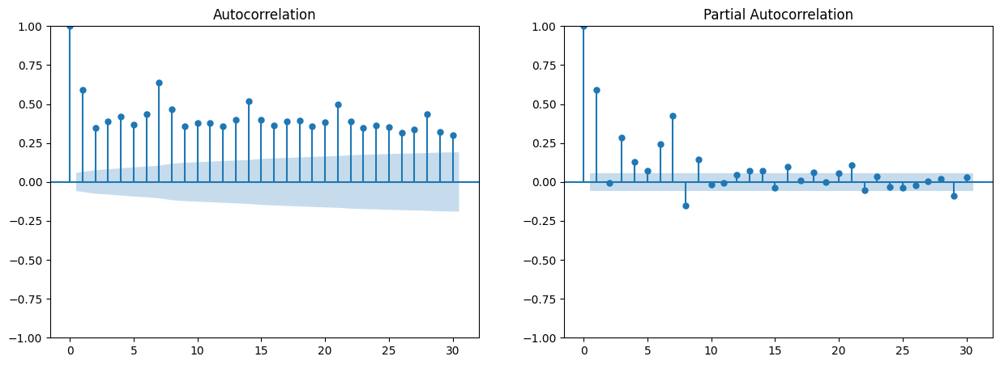

Prague_3


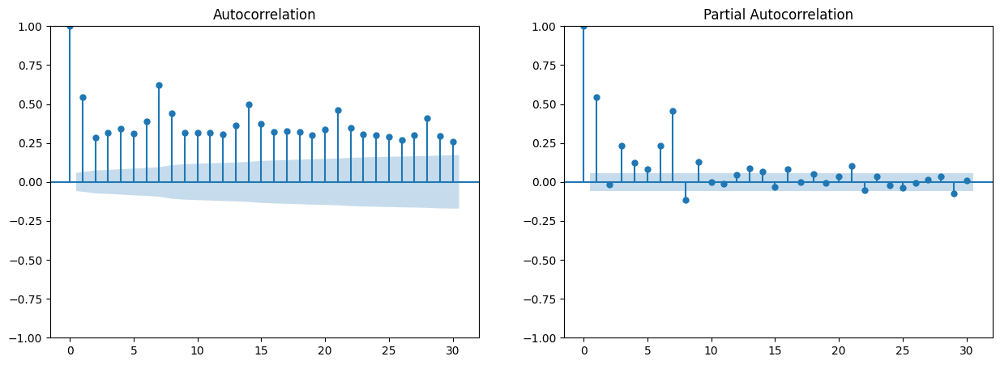

Munich_1


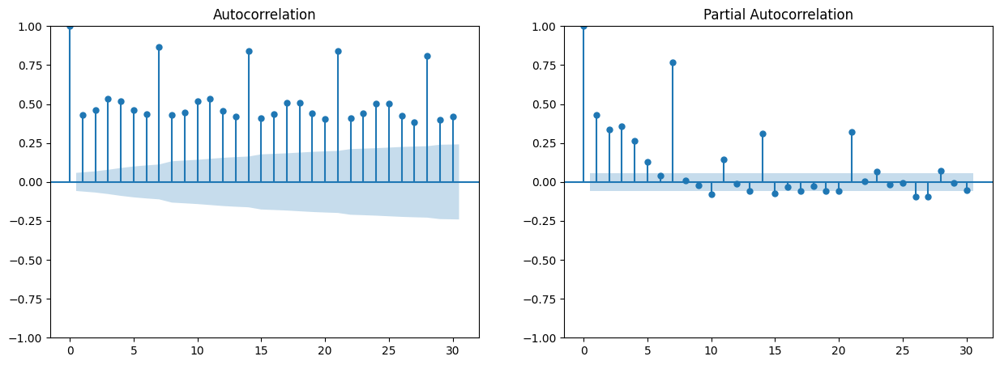

Budapest_1


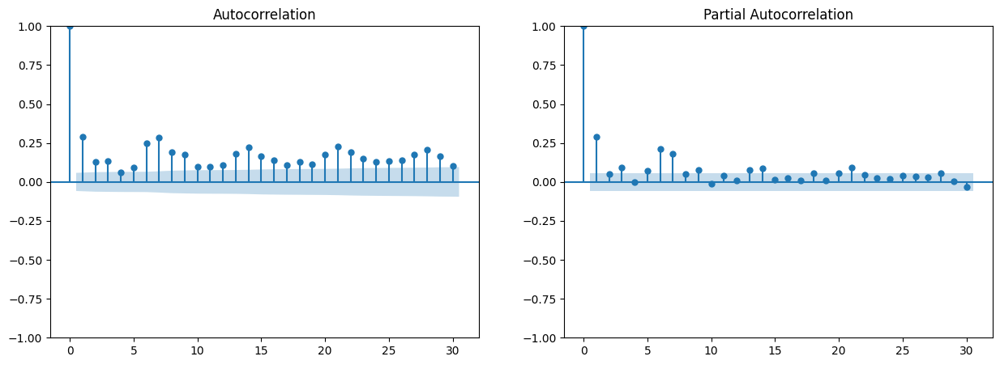

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

for warehouse in df['warehouse'].unique():
  print(f"{warehouse}")
  w_orders = train[train['warehouse'] == warehouse]['orders']

  fig, ax = plt.subplots(1, 2, figsize=(15, 5))
  plot_acf(w_orders, lags=30, ax=ax[0])
  plot_pacf(w_orders, lags=30, ax=ax[1])
  plt.show()

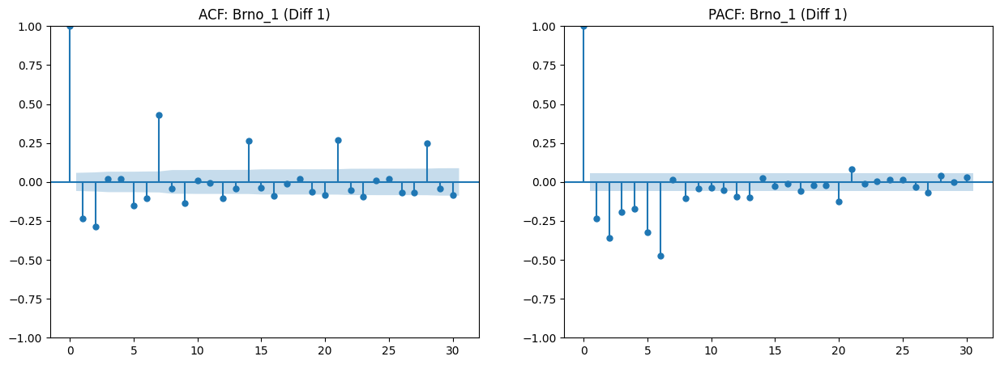

ADF Statistic: -10.2196
p-value: 5.3682e-18
Result: The series is stationary (Reject H0)


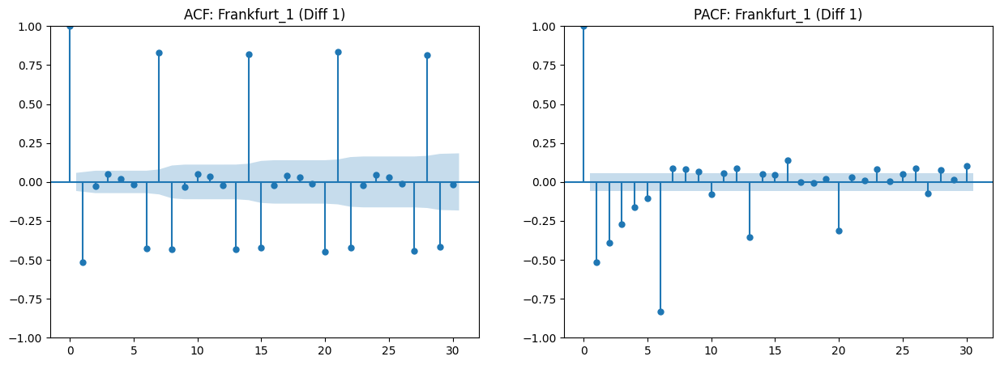

ADF Statistic: -8.9127
p-value: 1.0936e-14
Result: The series is stationary (Reject H0)


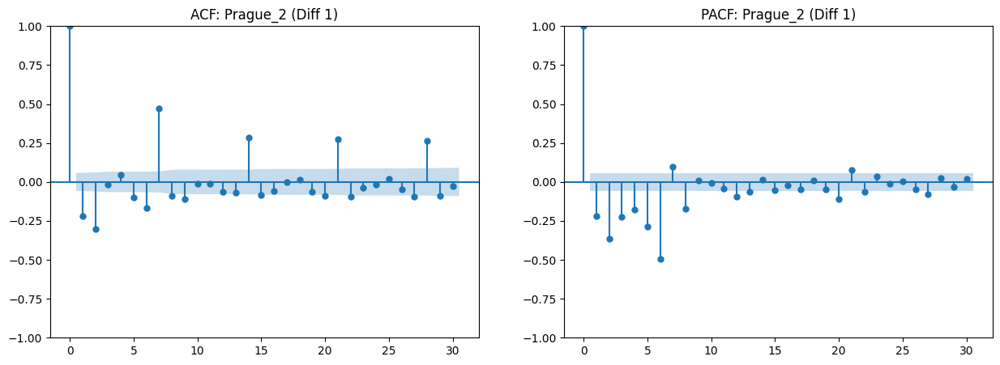

ADF Statistic: -10.4983
p-value: 1.1005e-18
Result: The series is stationary (Reject H0)


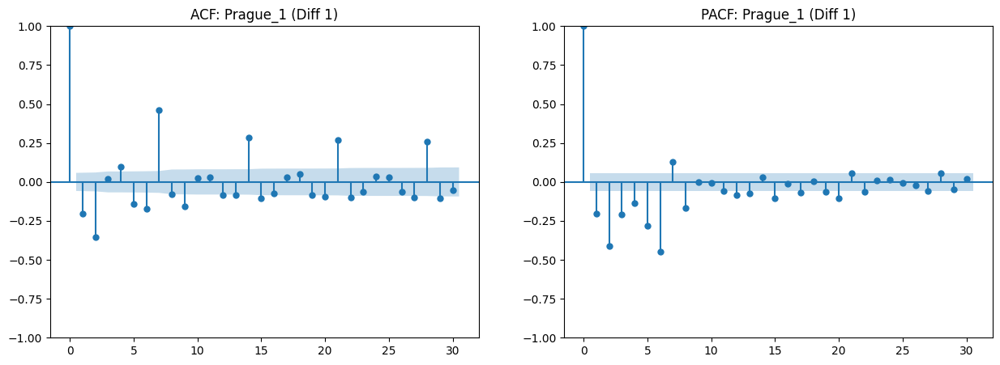

ADF Statistic: -11.0500
p-value: 5.1095e-20
Result: The series is stationary (Reject H0)


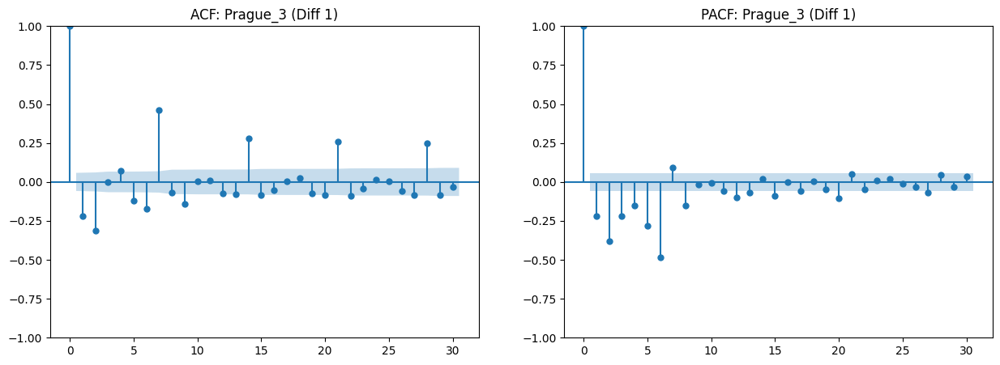

ADF Statistic: -10.8120
p-value: 1.8980e-19
Result: The series is stationary (Reject H0)


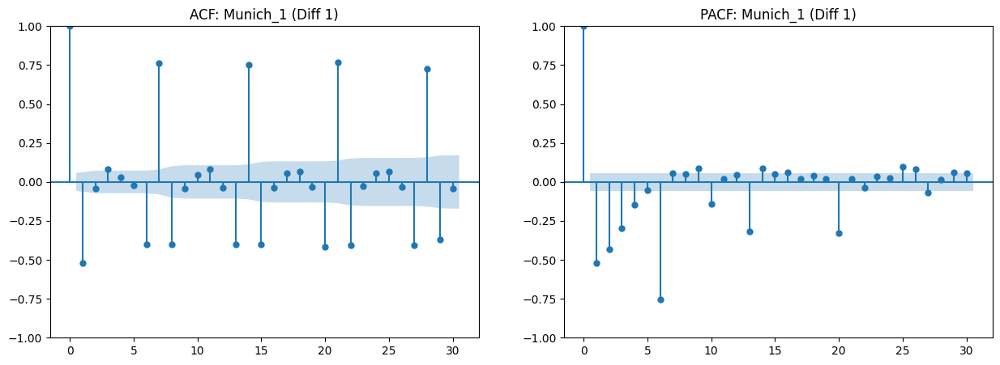

ADF Statistic: -11.0524
p-value: 5.0428e-20
Result: The series is stationary (Reject H0)


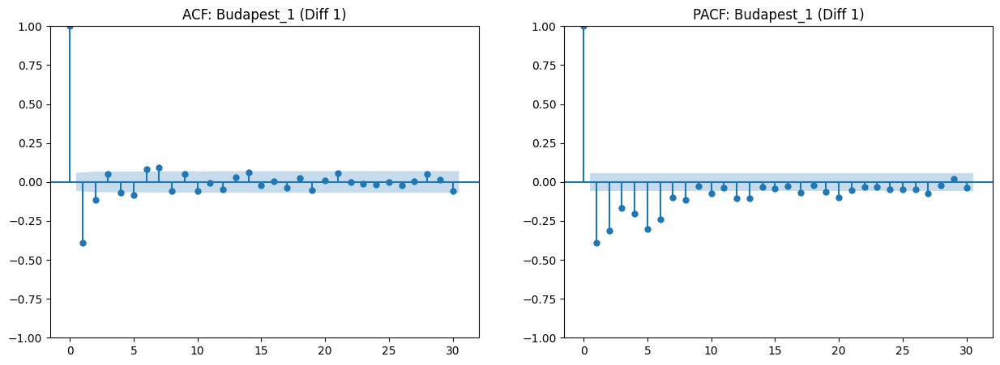

ADF Statistic: -13.0916
p-value: 1.7839e-24
Result: The series is stationary (Reject H0)


In [ ]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller

warehouses = train['warehouse'].unique()

for w in warehouses:
    w_orders = train[train['warehouse'] == w].copy()

    # Apply First Difference (Lag 1)
    w_orders['stationary_series'] = w_orders['orders'].diff(1).dropna()

    clean_series = w_orders['stationary_series'].dropna()

    fig, ax = plt.subplots(1, 2, figsize=(15, 5))
    plot_acf(clean_series, lags=30, ax=ax[0], title=f"ACF: {w} (Diff 1)")
    plot_pacf(clean_series, lags=30, ax=ax[1], title=f"PACF: {w} (Diff 1)")
    plt.show()

    # 2. Augmented Dickey-Fuller Test
    adf_result = adfuller(clean_series)
    print(f'ADF Statistic: {adf_result[0]:.4f}')
    print(f'p-value: {adf_result[1]:.4e}')

    if adf_result[1] <= 0.05:
        print("Result: The series is stationary (Reject H0)")
    else:
        print("Result: The series is NOT stationary (Fail to reject H0). Need further differencing.")

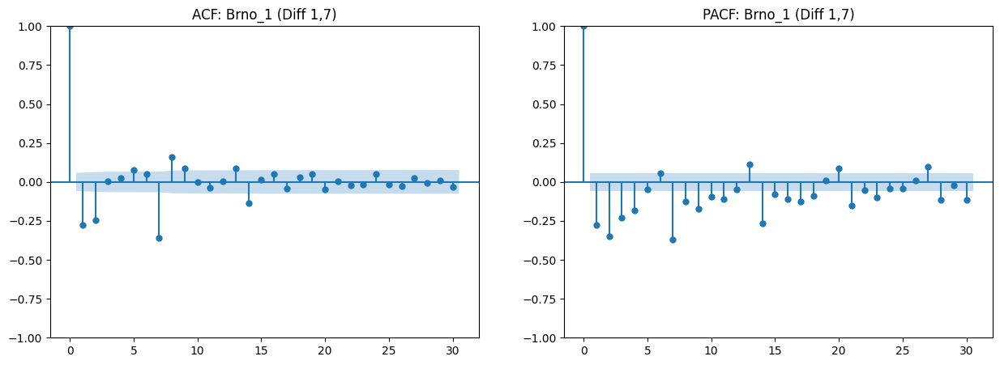

ADF Statistic: -13.0005
p-value: 2.6938e-24
Result: The series is stationary (Reject H0)


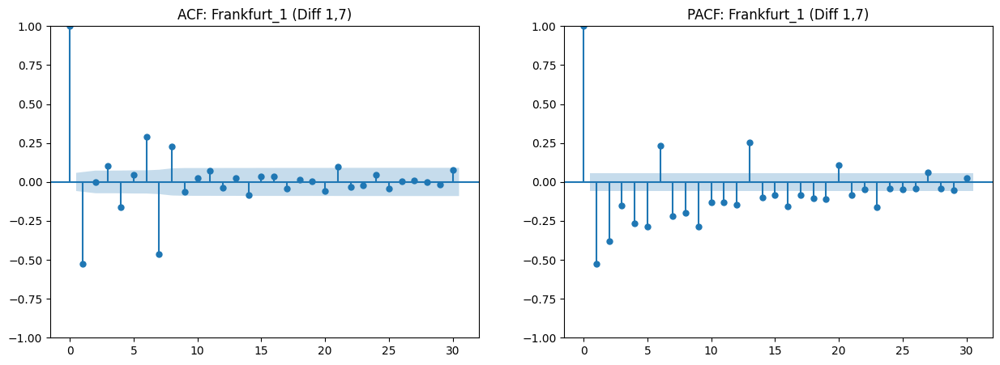

ADF Statistic: -13.6206
p-value: 1.7996e-25
Result: The series is stationary (Reject H0)


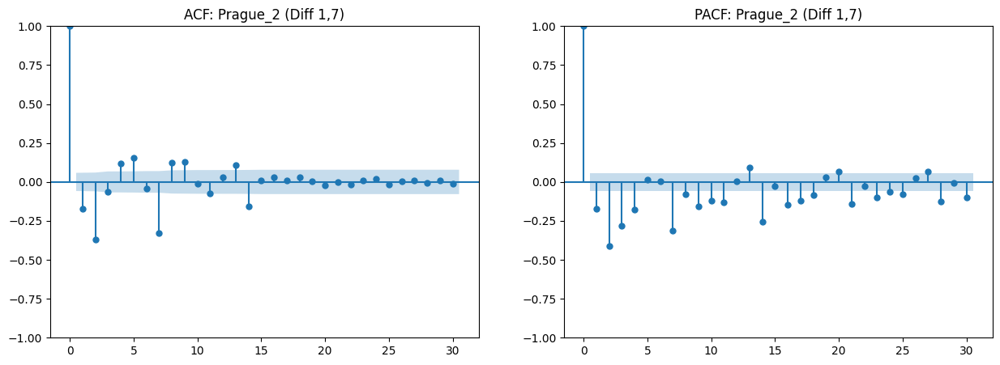

ADF Statistic: -12.6173
p-value: 1.6065e-23
Result: The series is stationary (Reject H0)


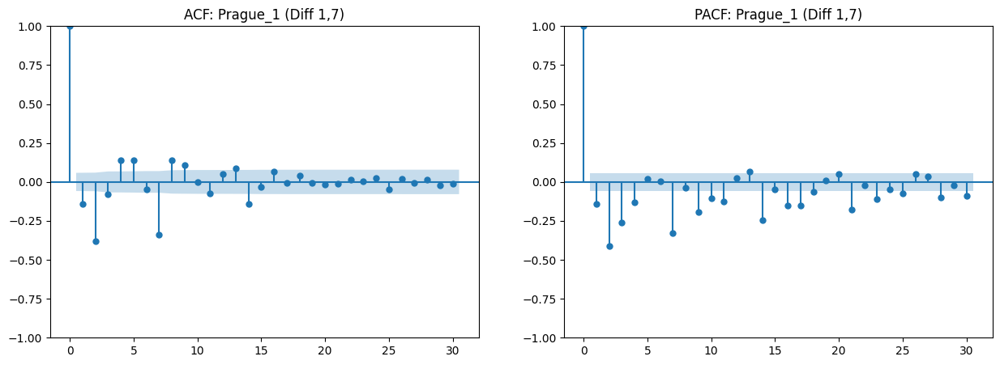

ADF Statistic: -13.4341
p-value: 3.9608e-25
Result: The series is stationary (Reject H0)


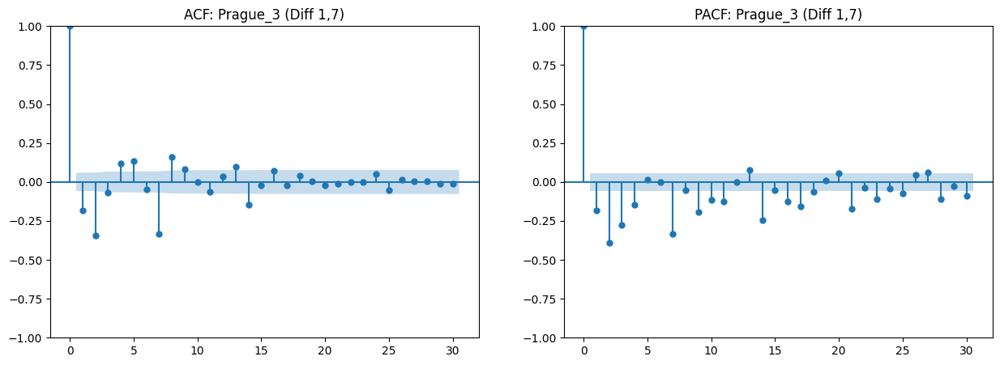

ADF Statistic: -13.5580
p-value: 2.3392e-25
Result: The series is stationary (Reject H0)


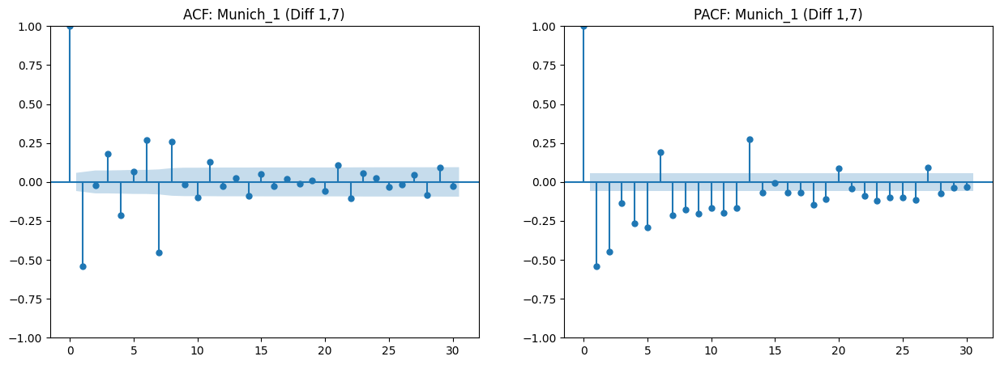

ADF Statistic: -12.9072
p-value: 4.1295e-24
Result: The series is stationary (Reject H0)


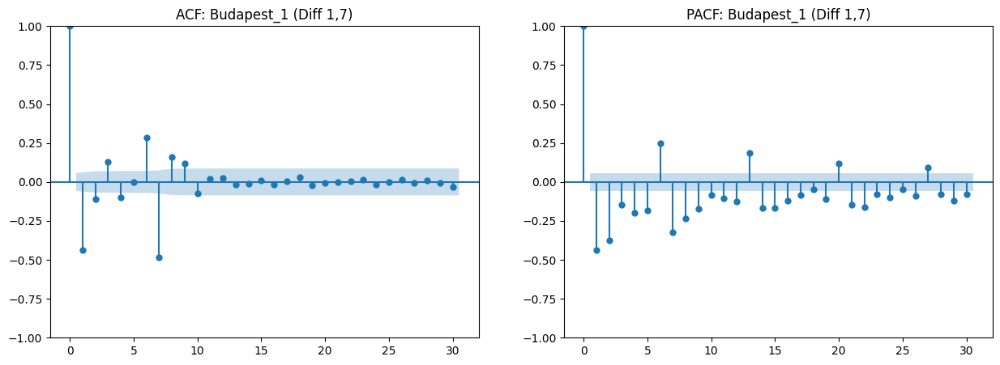

ADF Statistic: -14.3966
p-value: 8.6457e-27
Result: The series is stationary (Reject H0)


In [ ]:
for w in warehouses:
    w_orders = train[train['warehouse'] == w].copy()

    # Apply First Difference (Lag 1) and Seasonal Difference (Lag 7)
    w_orders['stationary_series'] = w_orders['orders'].diff(1).diff(7).dropna()

    clean_series = w_orders['stationary_series'].dropna()

    fig, ax = plt.subplots(1, 2, figsize=(15, 5))
    plot_acf(clean_series, lags=30, ax=ax[0], title=f"ACF: {w} (Diff 1,7)")
    plot_pacf(clean_series, lags=30, ax=ax[1], title=f"PACF: {w} (Diff 1,7)")
    plt.show()

    # 2. Augmented Dickey-Fuller Test
    adf_result = adfuller(clean_series)
    print(f'ADF Statistic: {adf_result[0]:.4f}')
    print(f'p-value: {adf_result[1]:.4e}')

    if adf_result[1] <= 0.05:
        print("Result: The series is stationary (Reject H0)")
    else:
        print("Result: The series is NOT stationary (Fail to reject H0). Try further differencing.")

## ARIMA hyperparam search

In [ ]:
warehouses

array(['Brno_1', 'Frankfurt_1', 'Prague_2', 'Prague_1', 'Prague_3',
       'Munich_1', 'Budapest_1'], dtype=object)

In [ ]:
def wape(y_true, y_pred):
    return np.sum(np.abs(y_true - y_pred)) / np.sum(np.abs(y_true))

def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

In [ ]:
def arima_cv_metrics(series, order, splits=3, test_size=60, horizons=[7,30,60]):
    """
    Returns:
        mean_rmse, mean_wape, errors_by_horizon
    """
    tscv = TimeSeriesSplit(n_splits=splits, test_size=test_size)

    rmses = []
    wapes = []

    horizon_errors = {h: {'rmse': [], 'wape': []} for h in horizons}

    for train_idx, test_idx in tscv.split(series):
        train, test = series[train_idx], series[test_idx]
        try:
            model = ARIMA(train, order=order)
            fit = model.fit()
            preds = fit.forecast(len(test))

            # overall errors
            rmses.append(rmse(test, preds))
            wapes.append(wape(test, preds))

            # errors by horizon
            for h in horizons:
                if len(test) >= h:
                    horizon_errors[h]['rmse'].append(rmse(test[:h], preds[:h]))
                    horizon_errors[h]['wape'].append(wape(test[:h], preds[:h]))
        except:
            return np.inf, np.inf, None

    mean_rmse = np.mean(rmses)
    mean_wape = np.mean(wapes)

    for h in horizons:
        horizon_errors[h]['rmse'] = np.mean(horizon_errors[h]['rmse'])
        horizon_errors[h]['wape'] = np.mean(horizon_errors[h]['wape'])

    return mean_rmse, mean_wape, horizon_errors

In [ ]:
p_values = [1,3,5,7]
d_values = [1]
q_values = [0,1]

warehouses = train['warehouse'].unique()
all_results = []

total_rmse = []
total_wape = []

for wh in warehouses:
    print(f"\n---------- Warehouse: {wh} ----------")
    series = np.asarray(train[train['warehouse'] == wh]['orders'])

    best_rmse = np.inf
    best_order = None
    best_metrics = None

    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)
                mean_rmse, mean_wape, horizon_errors = arima_cv_metrics(series, order)
                # print per candidate
                print(f"ARIMA{order} → RMSE: {mean_rmse:.2f}, WAPE: {mean_wape:.3f}")

                if mean_rmse < best_rmse:
                    best_rmse = mean_rmse
                    best_order = order
                    best_metrics = {'rmse': mean_rmse, 'wape': mean_wape, 'horizon': horizon_errors}

    print(f"\nBest ARIMA for {wh}: {best_order}")
    print(f"RMSE: {best_metrics['rmse']:.2f}, WAPE: {best_metrics['wape']:.3f}")
    print("Error by horizon:")
    for h, vals in best_metrics['horizon'].items():
        print(f"{h} days → RMSE: {vals['rmse']:.2f}, WAPE: {vals['wape']:.3f}")

    # Save per warehouse
    all_results.append({'warehouse': wh,
                        'best_order': best_order,
                        'rmse': best_metrics['rmse'],
                        'wape': best_metrics['wape'],
                        'horizon_errors': best_metrics['horizon']})

    total_rmse.append(best_metrics['rmse'])
    total_wape.append(best_metrics['wape'])

# --- Total / aggregate errors across warehouses ---
print("\n========== Total / Aggregate Errors ==========")
print(f"Mean RMSE across warehouses: {np.mean(total_rmse):.2f}")
print(f"Mean WAPE across warehouses: {np.mean(total_wape):.3f}")



---------- Warehouse: Brno_1 ----------
ARIMA(1, 1, 0) → RMSE: 981.71, WAPE: 0.078
ARIMA(1, 1, 1) → RMSE: 1027.41, WAPE: 0.083
ARIMA(3, 1, 0) → RMSE: 988.88, WAPE: 0.081
ARIMA(3, 1, 1) → RMSE: 1007.98, WAPE: 0.081
ARIMA(5, 1, 0) → RMSE: 955.33, WAPE: 0.075
ARIMA(5, 1, 1) → RMSE: 964.41, WAPE: 0.075
ARIMA(7, 1, 0) → RMSE: 940.54, WAPE: 0.072


/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


ARIMA(7, 1, 1) → RMSE: 990.94, WAPE: 0.078

Best ARIMA for Brno_1: (7, 1, 0)
RMSE: 940.54, WAPE: 0.072
Error by horizon:
7 days → RMSE: 415.86, WAPE: 0.041
30 days → RMSE: 539.21, WAPE: 0.049
60 days → RMSE: 940.54, WAPE: 0.072

---------- Warehouse: Frankfurt_1 ----------
ARIMA(1, 1, 0) → RMSE: 679.84, WAPE: 0.299
ARIMA(1, 1, 1) → RMSE: 635.11, WAPE: 0.340
ARIMA(3, 1, 0) → RMSE: 655.87, WAPE: 0.344
ARIMA(3, 1, 1) → RMSE: 634.64, WAPE: 0.337
ARIMA(5, 1, 0) → RMSE: 653.83, WAPE: 0.342
ARIMA(5, 1, 1) → RMSE: 631.95, WAPE: 0.327
ARIMA(7, 1, 0) → RMSE: 437.71, WAPE: 0.215


/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


ARIMA(7, 1, 1) → RMSE: 440.11, WAPE: 0.215

Best ARIMA for Frankfurt_1: (7, 1, 0)
RMSE: 437.71, WAPE: 0.215
Error by horizon:
7 days → RMSE: 108.07, WAPE: 0.061
30 days → RMSE: 292.71, WAPE: 0.144
60 days → RMSE: 437.71, WAPE: 0.215

---------- Warehouse: Prague_2 ----------
ARIMA(1, 1, 0) → RMSE: 758.84, WAPE: 0.093
ARIMA(1, 1, 1) → RMSE: 736.93, WAPE: 0.085
ARIMA(3, 1, 0) → RMSE: 741.64, WAPE: 0.090
ARIMA(3, 1, 1) → RMSE: 726.54, WAPE: 0.083
ARIMA(5, 1, 0) → RMSE: 705.38, WAPE: 0.080
ARIMA(5, 1, 1) → RMSE: 699.77, WAPE: 0.078
ARIMA(7, 1, 0) → RMSE: 688.82, WAPE: 0.076
ARIMA(7, 1, 1) → RMSE: 687.41, WAPE: 0.076

Best ARIMA for Prague_2: (7, 1, 1)
RMSE: 687.41, WAPE: 0.076
Error by horizon:
7 days → RMSE: 282.30, WAPE: 0.040
30 days → RMSE: 382.94, WAPE: 0.050
60 days → RMSE: 687.41, WAPE: 0.076

---------- Warehouse: Prague_1 ----------
ARIMA(1, 1, 0) → RMSE: 1297.36, WAPE: 0.089
ARIMA(1, 1, 1) → RMSE: 1290.03, WAPE: 0.087
ARIMA(3, 1, 0) → RMSE: 1271.33, WAPE: 0.086
ARIMA(3, 1, 1) → R

/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/stat

ARIMA(7, 1, 1) → RMSE: 1609.57, WAPE: 0.310

Best ARIMA for Munich_1: (7, 1, 0)
RMSE: 1606.59, WAPE: 0.311
Error by horizon:
7 days → RMSE: 393.85, WAPE: 0.087
30 days → RMSE: 1034.72, WAPE: 0.205
60 days → RMSE: 1606.59, WAPE: 0.311

---------- Warehouse: Budapest_1 ----------
ARIMA(1, 1, 0) → RMSE: 1185.38, WAPE: 0.090
ARIMA(1, 1, 1) → RMSE: 1214.00, WAPE: 0.114
ARIMA(3, 1, 0) → RMSE: 1182.88, WAPE: 0.091
ARIMA(3, 1, 1) → RMSE: 1211.58, WAPE: 0.113
ARIMA(5, 1, 0) → RMSE: 1179.45, WAPE: 0.088
ARIMA(5, 1, 1) → RMSE: 1203.35, WAPE: 0.108
ARIMA(7, 1, 0) → RMSE: 1177.18, WAPE: 0.086
ARIMA(7, 1, 1) → RMSE: 1210.03, WAPE: 0.112

Best ARIMA for Budapest_1: (7, 1, 0)
RMSE: 1177.18, WAPE: 0.086
Error by horizon:
7 days → RMSE: 220.66, WAPE: 0.032
30 days → RMSE: 271.67, WAPE: 0.034
60 days → RMSE: 1177.18, WAPE: 0.086

========== Total / Aggregate Errors ==========
Mean RMSE across warehouses: 949.08
Mean WAPE across warehouses: 0.130


## SARIMA hyperparam search

In [ ]:
def sarima_cv_metrics(series, order, seasonal_order, splits=3, test_size=60, horizons=[7,30,60]):
    tscv = TimeSeriesSplit(n_splits=splits, test_size=test_size)
    rmses = []
    wapes = []
    horizon_errors = {h: {'rmse': [], 'wape': []} for h in horizons}

    for train_idx, test_idx in tscv.split(series):
        train, test = series[train_idx], series[test_idx]
        try:
            model = SARIMAX(train, order=order, seasonal_order=seasonal_order,
                            enforce_stationarity=False, enforce_invertibility=False)
            fit = model.fit(disp=False)
            preds = fit.forecast(len(test))

            rmses.append(rmse(test, preds))
            wapes.append(wape(test, preds))

            for h in horizons:
                if len(test) >= h:
                    horizon_errors[h]['rmse'].append(rmse(test[:h], preds[:h]))
                    horizon_errors[h]['wape'].append(wape(test[:h], preds[:h]))
        except Exception as e:
            # skip failed fold, continue
            print(f"Skipping SARIMA{order}x{seasonal_order} for this fold: {e}")
            continue

    if len(rmses) == 0:
        return np.inf, np.inf, None

    mean_rmse = np.mean(rmses)
    mean_wape = np.mean(wapes)

    for h in horizons:
        horizon_errors[h]['rmse'] = np.mean(horizon_errors[h]['rmse']) if horizon_errors[h]['rmse'] else np.nan
        horizon_errors[h]['wape'] = np.mean(horizon_errors[h]['wape']) if horizon_errors[h]['wape'] else np.nan

    return mean_rmse, mean_wape, horizon_errors


In [ ]:
p_values = [0,1,2]
d_values = [1]
q_values = [0,1]

P_values = [0,1]
D_values = [0,1]
Q_values = [0,1]
s = 7

warehouses = train['warehouse'].unique()
sarima_results = []

total_rmse = []
total_wape = []

for wh in warehouses:
    print(f"\n---------- Warehouse: {wh} ----------")
    series = np.asarray(train[train['warehouse'] == wh]['orders'])

    best_rmse = np.inf
    best_order = None
    best_seasonal_order = None
    best_metrics = None

    for p in p_values:
        for d in d_values:
            for q in q_values:
                for P in P_values:
                    for D in D_values:
                        for Q in Q_values:
                            order = (p,d,q)
                            seasonal_order = (P,D,Q,s)
                            mean_rmse, mean_wape, horizon_errors = sarima_cv_metrics(series, order, seasonal_order)
                            print(f"SARIMA{order}x{seasonal_order} → RMSE: {mean_rmse:.2f}, WAPE: {mean_wape:.3f}")

                            if mean_rmse < best_rmse:
                                best_rmse = mean_rmse
                                best_order = order
                                best_seasonal_order = seasonal_order
                                best_metrics = {'rmse': mean_rmse, 'wape': mean_wape, 'horizon': horizon_errors}

    print(f"\nBest SARIMA for {wh}: {best_order} x {best_seasonal_order}")
    print(f"RMSE: {best_metrics['rmse']:.2f}, WAPE: {best_metrics['wape']:.3f}")
    print("Error by horizon:")
    for h, vals in best_metrics['horizon'].items():
        print(f"{h} days → RMSE: {vals['rmse']:.2f}, WAPE: {vals['wape']:.3f}")

    # save per warehouse
    sarima_results.append({'warehouse': wh,
                           'best_order': best_order,
                           'best_seasonal_order': best_seasonal_order,
                           'rmse': best_metrics['rmse'],
                           'wape': best_metrics['wape'],
                           'horizon_errors': best_metrics['horizon']})

    total_rmse.append(best_metrics['rmse'])
    total_wape.append(best_metrics['wape'])

# --- Total / aggregate errors ---
print("\n========== Total / Aggregate Errors ==========")
print(f"Mean RMSE across warehouses: {np.mean(total_rmse):.2f}")
print(f"Mean WAPE across warehouses: {np.mean(total_wape):.3f}")


---------- Warehouse: Brno_1 ----------
SARIMA(0, 1, 0)x(0, 0, 0, 7) → RMSE: 1016.78, WAPE: 0.080
SARIMA(0, 1, 0)x(0, 0, 1, 7) → RMSE: 983.53, WAPE: 0.076
SARIMA(0, 1, 0)x(0, 1, 0, 7) → RMSE: 1458.82, WAPE: 0.138
SARIMA(0, 1, 0)x(0, 1, 1, 7) → RMSE: 803.93, WAPE: 0.057
SARIMA(0, 1, 0)x(1, 0, 0, 7) → RMSE: 950.76, WAPE: 0.071
SARIMA(0, 1, 0)x(1, 0, 1, 7) → RMSE: 821.97, WAPE: 0.058
SARIMA(0, 1, 0)x(1, 1, 0, 7) → RMSE: 1299.99, WAPE: 0.118
SARIMA(0, 1, 0)x(1, 1, 1, 7) → RMSE: 808.17, WAPE: 0.058
SARIMA(0, 1, 1)x(0, 0, 0, 7) → RMSE: 1005.08, WAPE: 0.080
SARIMA(0, 1, 1)x(0, 0, 1, 7) → RMSE: 990.76, WAPE: 0.079
SARIMA(0, 1, 1)x(0, 1, 0, 7) → RMSE: 816.91, WAPE: 0.064
SARIMA(0, 1, 1)x(0, 1, 1, 7) → RMSE: 812.49, WAPE: 0.060
SARIMA(0, 1, 1)x(1, 0, 0, 7) → RMSE: 975.91, WAPE: 0.077
SARIMA(0, 1, 1)x(1, 0, 1, 7) → RMSE: 811.22, WAPE: 0.058
SARIMA(0, 1, 1)x(1, 1, 0, 7) → RMSE: 831.75, WAPE: 0.066
SARIMA(0, 1, 1)x(1, 1, 1, 7) → RMSE: 831.46, WAPE: 0.063
SARIMA(1, 1, 0)x(0, 0, 0, 7) → RMSE: 981.82

/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(1, 0, 1, 7) → RMSE: 834.03, WAPE: 0.061
SARIMA(2, 1, 1)x(1, 1, 0, 7) → RMSE: 828.95, WAPE: 0.065
SARIMA(2, 1, 1)x(1, 1, 1, 7) → RMSE: 842.20, WAPE: 0.064

Best SARIMA for Brno_1: (2, 1, 0) x (0, 1, 1, 7)
RMSE: 782.44, WAPE: 0.056
Error by horizon:
7 days → RMSE: 359.92, WAPE: 0.037
30 days → RMSE: 408.82, WAPE: 0.040
60 days → RMSE: 782.44, WAPE: 0.056

---------- Warehouse: Frankfurt_1 ----------
SARIMA(0, 1, 0)x(0, 0, 0, 7) → RMSE: 683.24, WAPE: 0.307
SARIMA(0, 1, 0)x(0, 0, 1, 7) → RMSE: 660.06, WAPE: 0.300
SARIMA(0, 1, 0)x(0, 1, 0, 7) → RMSE: 240.24, WAPE: 0.096
SARIMA(0, 1, 0)x(0, 1, 1, 7) → RMSE: 236.91, WAPE: 0.093
SARIMA(0, 1, 0)x(1, 0, 0, 7) → RMSE: 442.64, WAPE: 0.198
SARIMA(0, 1, 0)x(1, 0, 1, 7) → RMSE: 235.11, WAPE: 0.092
SARIMA(0, 1, 0)x(1, 1, 0, 7) → RMSE: 231.53, WAPE: 0.073
SARIMA(0, 1, 0)x(1, 1, 1, 7) → RMSE: 237.00, WAPE: 0.094
SARIMA(0, 1, 1)x(0, 0, 0, 7) → RMSE: 636.06, WAPE: 0.342
SARIMA(0, 1, 1)x(0, 0, 1, 7) → RMSE: 617.11, WAPE: 0.332
SARIMA(0, 1,

/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(1, 0, 1, 7) → RMSE: 658.13, WAPE: 0.072
SARIMA(2, 1, 1)x(1, 1, 0, 7) → RMSE: 599.54, WAPE: 0.066
SARIMA(2, 1, 1)x(1, 1, 1, 7) → RMSE: 641.86, WAPE: 0.070

Best SARIMA for Prague_2: (1, 1, 1) x (0, 1, 0, 7)
RMSE: 587.90, WAPE: 0.064
Error by horizon:
7 days → RMSE: 301.20, WAPE: 0.041
30 days → RMSE: 324.72, WAPE: 0.043
60 days → RMSE: 587.90, WAPE: 0.064

---------- Warehouse: Prague_1 ----------
SARIMA(0, 1, 0)x(0, 0, 0, 7) → RMSE: 1376.11, WAPE: 0.097
SARIMA(0, 1, 0)x(0, 0, 1, 7) → RMSE: 1419.72, WAPE: 0.101
SARIMA(0, 1, 0)x(0, 1, 0, 7) → RMSE: 2025.79, WAPE: 0.166
SARIMA(0, 1, 0)x(0, 1, 1, 7) → RMSE: 1144.17, WAPE: 0.071
SARIMA(0, 1, 0)x(1, 0, 0, 7) → RMSE: 1375.96, WAPE: 0.093
SARIMA(0, 1, 0)x(1, 0, 1, 7) → RMSE: 1159.73, WAPE: 0.072
SARIMA(0, 1, 0)x(1, 1, 0, 7) → RMSE: 1459.22, WAPE: 0.111
SARIMA(0, 1, 0)x(1, 1, 1, 7) → RMSE: 1169.38, WAPE: 0.073
SARIMA(0, 1, 1)x(0, 0, 0, 7) → RMSE: 1267.43, WAPE: 0.085
SARIMA(0, 1, 1)x(0, 0, 1, 7) → RMSE: 1243.01, WAPE: 0.082


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 1)x(0, 1, 0, 7) → RMSE: 1072.11, WAPE: 0.067
SARIMA(0, 1, 1)x(0, 1, 1, 7) → RMSE: 1163.05, WAPE: 0.073
SARIMA(0, 1, 1)x(1, 0, 0, 7) → RMSE: 1220.93, WAPE: 0.079
SARIMA(0, 1, 1)x(1, 0, 1, 7) → RMSE: 1163.04, WAPE: 0.074
SARIMA(0, 1, 1)x(1, 1, 0, 7) → RMSE: 1096.61, WAPE: 0.070
SARIMA(0, 1, 1)x(1, 1, 1, 7) → RMSE: 1137.23, WAPE: 0.072
SARIMA(1, 1, 0)x(0, 0, 0, 7) → RMSE: 1296.92, WAPE: 0.089
SARIMA(1, 1, 0)x(0, 0, 1, 7) → RMSE: 1333.01, WAPE: 0.091
SARIMA(1, 1, 0)x(0, 1, 0, 7) → RMSE: 1875.81, WAPE: 0.151
SARIMA(1, 1, 0)x(0, 1, 1, 7) → RMSE: 1128.88, WAPE: 0.070
SARIMA(1, 1, 0)x(1, 0, 0, 7) → RMSE: 1280.49, WAPE: 0.082
SARIMA(1, 1, 0)x(1, 0, 1, 7) → RMSE: 1136.11, WAPE: 0.071
SARIMA(1, 1, 0)x(1, 1, 0, 7) → RMSE: 1353.15, WAPE: 0.102
SARIMA(1, 1, 0)x(1, 1, 1, 7) → RMSE: 1143.18, WAPE: 0.071
SARIMA(1, 1, 1)x(0, 0, 0, 7) → RMSE: 1298.48, WAPE: 0.089
SARIMA(1, 1, 1)x(0, 0, 1, 7) → RMSE: 1284.28, WAPE: 0.087
SARIMA(1, 1, 1)x(0, 1, 0, 7) → RMSE: 1066.86, WAPE: 0.066
SARIMA(1, 1, 1

/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(1, 0, 1, 7) → RMSE: 1162.42, WAPE: 0.105
SARIMA(1, 1, 1)x(1, 1, 0, 7) → RMSE: 1116.61, WAPE: 0.073
SARIMA(1, 1, 1)x(1, 1, 1, 7) → RMSE: 1152.90, WAPE: 0.106
SARIMA(2, 1, 0)x(0, 0, 0, 7) → RMSE: 1182.80, WAPE: 0.090
SARIMA(2, 1, 0)x(0, 0, 1, 7) → RMSE: 1184.58, WAPE: 0.092
SARIMA(2, 1, 0)x(0, 1, 0, 7) → RMSE: 1146.57, WAPE: 0.073
SARIMA(2, 1, 0)x(0, 1, 1, 7) → RMSE: 1144.32, WAPE: 0.092
SARIMA(2, 1, 0)x(1, 0, 0, 7) → RMSE: 1181.85, WAPE: 0.090
SARIMA(2, 1, 0)x(1, 0, 1, 7) → RMSE: 1144.33, WAPE: 0.091
SARIMA(2, 1, 0)x(1, 1, 0, 7) → RMSE: 2491.90, WAPE: 0.291
SARIMA(2, 1, 0)x(1, 1, 1, 7) → RMSE: 1142.29, WAPE: 0.091
SARIMA(2, 1, 1)x(0, 0, 0, 7) → RMSE: 1211.66, WAPE: 0.113
SARIMA(2, 1, 1)x(0, 0, 1, 7) → RMSE: 1213.21, WAPE: 0.114
SARIMA(2, 1, 1)x(0, 1, 0, 7) → RMSE: 1119.62, WAPE: 0.071
SARIMA(2, 1, 1)x(0, 1, 1, 7) → RMSE: 1151.51, WAPE: 0.106
SARIMA(2, 1, 1)x(1, 0, 0, 7) → RMSE: 1213.16, WAPE: 0.114


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(1, 0, 1, 7) → RMSE: 1163.41, WAPE: 0.109
SARIMA(2, 1, 1)x(1, 1, 0, 7) → RMSE: 1117.02, WAPE: 0.073
SARIMA(2, 1, 1)x(1, 1, 1, 7) → RMSE: 1152.16, WAPE: 0.106

Best SARIMA for Budapest_1: (1, 1, 1) x (1, 1, 0, 7)
RMSE: 1116.61, WAPE: 0.073
Error by horizon:
7 days → RMSE: 188.38, WAPE: 0.021
30 days → RMSE: 195.40, WAPE: 0.026
60 days → RMSE: 1116.61, WAPE: 0.073

========== Total / Aggregate Errors ==========
Mean RMSE across warehouses: 784.29
Mean WAPE across warehouses: 0.084


### Lasso Regression with SFS and permutation importance

In [ ]:
def wape(y_true, y_pred):
    return np.sum(np.abs(y_true - y_pred)) / np.sum(np.abs(y_true))

linreg_train = train[['date', 'warehouse', 'holiday_name', 'holiday', 'shops_closed',
                      'winter_school_holidays', 'school_holidays','weekday_name', 'day',
                      'hour', 'month', 'month_name', 'year', 'quarter',
                      'year_quarter', 'month_day', 'orders']]  # target = 'orders'

num_features = ['day', 'hour', 'month', 'year']
other_features = ['shops_closed', 'winter_school_holidays', 'school_holidays']
cat_features = ['holiday_name', 'holiday', 'weekday_name', 'month_name', 'year_quarter', 'quarter', 'month_day']

target_col = 'orders'

preprocessor = ColumnTransformer(
    transformers=[
        ('num', Pipeline([
            ('imputer', SimpleImputer(strategy='median')),
            ('scaler', StandardScaler())
        ]), num_features + other_features),

        ('cat', Pipeline([
            ('imputer', SimpleImputer(strategy='constant', fill_value='No Holiday')),
            ('target_enc', TargetEncoder())
        ]), cat_features)
    ]
)

warehouses = linreg_train['warehouse'].unique()
results = {}

total_rmse = []
total_wape = []

for wh in warehouses:
    print(f"\n---------- Warehouse: {wh} ----------")

    df_wh = linreg_train[linreg_train['warehouse']==wh].copy()
    df_model = df_wh.drop(columns=['date', 'warehouse'])

    X = df_model.drop(columns=[target_col])
    y = df_model[target_col]

    X_processed = preprocessor.fit_transform(X, y)
    X_processed_df = pd.DataFrame(X_processed, columns=num_features + other_features + cat_features, index=X.index)

    # Lasso Feature Selection
    lasso = LassoCV(cv=TimeSeriesSplit(n_splits=3, test_size=60), max_iter=10000, random_state=42)
    lasso.fit(X_processed_df, y)
    selected_lasso = X_processed_df.columns[lasso.coef_ != 0]
    print("Lasso-selected features:", selected_lasso.tolist())

    # Sequential Feature Selection (SFS)
    lr = LinearRegression()
    tscv = TimeSeriesSplit(n_splits=3, test_size=60)
    sfs = SequentialFeatureSelector(lr, n_features_to_select='auto', direction='forward', scoring='r2', cv=tscv, n_jobs=-1)
    sfs.fit(X_processed_df[selected_lasso], y)
    sfs_features = X_processed_df[selected_lasso].columns[sfs.get_support()]
    print("SFS-selected features:", sfs_features.tolist())

    # Permutation importance
    lr.fit(X_processed_df[sfs_features], y)
    perm = permutation_importance(lr, X_processed_df[sfs_features], y, n_repeats=10, random_state=42, scoring='r2')
    perm_scores = dict(zip(sfs_features, perm.importances_mean))
    perm_scores = dict(sorted(perm_scores.items(), key=lambda x: x[1], reverse=True))
    print("Top permutation importance features:")
    for f, score in perm_scores.items():
        print(f"{f}: {score:.4f}")

    # --- Accuracy measurements using TimeSeriesSplit ---
    rmse_list, wape_list = [], []
    for train_idx, test_idx in tscv.split(X_processed_df[sfs_features]):
        X_train, X_test = X_processed_df[sfs_features].iloc[train_idx], X_processed_df[sfs_features].iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        lr.fit(X_train, y_train)
        y_pred = lr.predict(X_test)

        rmse_list.append(np.sqrt(mean_squared_error(y_test, y_pred)))
        wape_list.append(wape(y_test, y_pred))

    print(f"TimeSeriesSplit CV metrics (mean ± std):")
    print(f"RMSE: {np.mean(rmse_list):.2f} ± {np.std(rmse_list):.2f}")
    print(f"WAPE:  {np.mean(wape_list):.2f} ± {np.std(wape_list):.2f}")

    # Save results
    results[wh] = {
        'lasso_features': selected_lasso.tolist(),
        'sfs_features': sfs_features.tolist(),
        'permutation_importance': perm_scores,
        'cv_metrics': {
            'RMSE': (np.mean(rmse_list), np.std(rmse_list)),
            'WAPE': (np.mean(wape_list), np.std(wape_list))
        }
    }

    total_rmse.append(np.mean(rmse_list))
    total_wape.append(np.mean(wape_list))

# --- Total / aggregate errors ---
print("\n========== Aggregate Errors Across Warehouses ==========")
print(f"Mean RMSE across warehouses: {np.mean(total_rmse):.2f}")
print(f"Mean WAPE across warehouses: {np.mean(total_wape):.3f}")



---------- Warehouse: Brno_1 ----------
Lasso-selected features: ['holiday_name', 'weekday_name', 'month_name', 'year_quarter', 'quarter', 'month_day']
SFS-selected features: ['year_quarter', 'quarter', 'month_day']
Top permutation importance features:
month_day: 1.0205
year_quarter: 0.7611
quarter: 0.2069
TimeSeriesSplit CV metrics (mean ± std):
RMSE: 620.88 ± 252.42
WAPE:  0.06 ± 0.02

---------- Warehouse: Frankfurt_1 ----------
Lasso-selected features: ['holiday_name', 'holiday', 'weekday_name', 'year_quarter', 'quarter', 'month_day']
SFS-selected features: ['weekday_name', 'year_quarter', 'month_day']
Top permutation importance features:
year_quarter: 1.2023
weekday_name: 0.2732
month_day: 0.0958
TimeSeriesSplit CV metrics (mean ± std):
RMSE: 353.94 ± 82.75
WAPE:  0.18 ± 0.06

---------- Warehouse: Prague_2 ----------
Lasso-selected features: ['holiday_name', 'holiday', 'weekday_name', 'month_name', 'year_quarter', 'quarter', 'month_day']
SFS-selected features: ['year_quarter', '

# SARIMAX model

In [ ]:
from sklearn.model_selection import TimeSeriesSplit
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import StandardScaler
from category_encoders import TargetEncoder

sfs_results = results  # from your previous LR/SFS results

# SARIMA orders from previous best models
sarima_orders = {
    'Brno_1': {'order': (2,1,0), 'seasonal_order': (0,1,1,7)},
    'Frankfurt_1': {'order': (2,1,0), 'seasonal_order': (1,1,0,7)},
    'Prague_2': {'order': (1,1,1), 'seasonal_order': (0,1,0,7)},
    'Prague_1': {'order': (1,1,1), 'seasonal_order': (0,1,0,7)},
    'Prague_3': {'order': (1,1,1), 'seasonal_order': (0,1,0,7)},
    'Munich_1': {'order': (0,1,1), 'seasonal_order': (1,1,0,7)},
    'Budapest_1': {'order': (1,1,1), 'seasonal_order': (1,1,0,7)}
}

tscv = TimeSeriesSplit(n_splits=3, test_size=60)
sarima_exog_cv_results = []
total_rmse = []
total_wape = []

for wh in train['warehouse'].unique():
    print(f"\n---------- Warehouse: {wh} ----------")

    df_wh = train[train['warehouse'] == wh].copy()
    y = df_wh['orders'].values
    exog_features = sfs_results[wh]['sfs_features']
    X_exog = df_wh[exog_features].copy()

    # --- Preprocessing ---
    cat_cols = X_exog.select_dtypes(include='object').columns.tolist()
    if cat_cols:
        te = TargetEncoder()
        X_exog[cat_cols] = te.fit_transform(X_exog[cat_cols], df_wh['orders'])

    num_cols = X_exog.select_dtypes(include='number').columns.tolist()
    if num_cols:
        scaler = StandardScaler()
        X_exog[num_cols] = scaler.fit_transform(X_exog[num_cols])

    X_exog = X_exog.values

    order = sarima_orders[wh]['order']
    seasonal_order = sarima_orders[wh]['seasonal_order']

    fold_rmse = []
    fold_wape = []
    horizon_errors = {7:{}, 30:{}, 60:{}}

    for train_idx, test_idx in tscv.split(y):
        y_train, y_test = y[train_idx], y[test_idx]
        exog_train, exog_test = X_exog[train_idx], X_exog[test_idx]

        model = SARIMAX(y_train, order=order, seasonal_order=seasonal_order,
                        exog=exog_train, enforce_stationarity=False, enforce_invertibility=False)
        fit = model.fit(disp=False)

        y_pred = fit.forecast(steps=len(y_test), exog=exog_test)
        rmse = np.sqrt(np.mean((y_test - y_pred)**2))
        wape = np.sum(np.abs(y_test - y_pred)) / np.sum(y_test)

        fold_rmse.append(rmse)
        fold_wape.append(wape)

        # horizon errors
        for h in [7,30,60]:
            if len(y_test) >= h:
                y_h = y_test[:h]
                y_pred_h = y_pred[:h]
                horizon_errors[h].setdefault('rmse', []).append(np.sqrt(np.mean((y_h - y_pred_h)**2)))
                horizon_errors[h].setdefault('wape', []).append(np.sum(np.abs(y_h - y_pred_h))/np.sum(y_h))

    # aggregate
    horizon_summary = {}
    for h in horizon_errors:
        horizon_summary[h] = {
            'rmse': np.mean(horizon_errors[h]['rmse']),
            'wape': np.mean(horizon_errors[h]['wape'])
        }

    print(f"TimeSeriesSplit CV metrics (mean ± std):")
    print(f"RMSE: {np.mean(fold_rmse):.2f} ± {np.std(fold_rmse):.2f}")
    print(f"WAPE: {np.mean(fold_wape):.3f} ± {np.std(fold_wape):.3f}")

    sarima_exog_cv_results.append({
        'warehouse': wh,
        'order': order,
        'seasonal_order': seasonal_order,
        'exog_features': exog_features,
        'rmse_mean': np.mean(fold_rmse),
        'rmse_std': np.std(fold_rmse),
        'wape_mean': np.mean(fold_wape),
        'wape_std': np.std(fold_wape),
        'horizon_errors': horizon_summary
    })

    total_rmse.append(np.mean(fold_rmse))
    total_wape.append(np.mean(fold_wape))

  # --- Total / aggregate errors ---
print("\n========== SARIMA + Exogenous Features ==========")
print(f"Mean RMSE across warehouses: {np.mean(total_rmse):.2f}")
print(f"Mean WAPE across warehouses: {np.mean(total_wape):.3f}")



---------- Warehouse: Brno_1 ----------
TimeSeriesSplit CV metrics (mean ± std):
RMSE: 459.35 ± 241.97
WAPE: 0.043 ± 0.020

---------- Warehouse: Frankfurt_1 ----------
TimeSeriesSplit CV metrics (mean ± std):
RMSE: 181.90 ± 140.32
WAPE: 0.095 ± 0.075

---------- Warehouse: Prague_2 ----------
TimeSeriesSplit CV metrics (mean ± std):
RMSE: 353.65 ± 184.54
WAPE: 0.046 ± 0.020

---------- Warehouse: Prague_1 ----------
TimeSeriesSplit CV metrics (mean ± std):
RMSE: 583.89 ± 340.08
WAPE: 0.043 ± 0.018

---------- Warehouse: Prague_3 ----------
TimeSeriesSplit CV metrics (mean ± std):
RMSE: 281.58 ± 111.51
WAPE: 0.042 ± 0.014

---------- Warehouse: Munich_1 ----------
TimeSeriesSplit CV metrics (mean ± std):
RMSE: 1023.61 ± 258.02
WAPE: 0.193 ± 0.030

---------- Warehouse: Budapest_1 ----------
TimeSeriesSplit CV metrics (mean ± std):
RMSE: 282.19 ± 141.52
WAPE: 0.035 ± 0.017

========== SARIMA + Exogenous Features ==========
Mean RMSE across warehouses: 452.31
Mean WAPE across warehouses